In [181]:
# import stuff
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
import os

import scipy
from scipy import signal
import h5py, time
from iminuit import Minuit, describe
from pprint import pprint # we use this to pretty print some stuff later
import glob
import pandas as pd
import sys
sys.path.append('/home/analysis_user/New_trap_code/Tools/')
import BeadDataFile
from discharge_tools import *
from bisect import bisect_left
from tqdm import tqdm


In [3]:
plt.rcParams["figure.figsize"] = (12,9)
plt.rcParams["font.size"]=(36)

In [4]:
v

In [5]:
def create_plot(x,y,xlim=130,ylim_factor=5):
    ylim_low=np.min(y)/ylim_factor
    ylim_up=np.max(y)*ylim_factor    
    _,ax = plt.subplots()
    ax.semilogy(x,y, '.-', label="x",markersize=1,linewidth=0.5)
    ax.legend()
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('PSD [a.u.]')
    plt.xlim(1,xlim)
    plt.ylim(ylim_low,ylim_up)
    plt.grid(True)
    plt.show()

In [6]:
def get_harmonics(input_psd,shake_freq,no_harmonics,res_factor=10,plot=False):
    harmonics = []
    FreqTF = np.arange(shake_freq,(shake_freq*no_harmonics+shake_freq),shake_freq)
    for i in range(no_harmonics):
        harmonics.append(input_psd[shake_freq*res_factor*(i+1)])
    if(plot==True):
        plt.plot(FreqTF,harmonics, marker ="o", linestyle ="")
        plt.yscale("log")
        #plt.show()
    return FreqTF,harmonics     

In [7]:
def get_mean_std_sum_of_harmonics(df,no_harmonics=10):
    mean_list, std_list, sum_list, median_list=([] for i in range(4))

    for i in np.arange(0,no_harmonics,1):
        std_list.append(np.std(df["%d" %i]))
        mean_list.append(np.mean(df["%d" % i])) 
        sum_list.append(np.sum(df["%d" %i]))
        median_list.append(np.median(df["%d" %i]))
    return mean_list,std_list,sum_list,median_list   

In [8]:
def plot_basics(folder_basic,Data_File_Number,axis='x',mode="psd_only",max_file=5,res=50000,fsamp=5000,save_files=True):
    folder_shaking = "/Shaking/" + "/Shaking%d/" % Data_File_Number
    folder = folder_basic + folder_shaking
    files = load_dir(folder, file_prefix = 'Shaking', max_file=max_file)
    if(mode=="psd_only"):
        for i in range(len(files)):
            data = files[i].xyz2
            data_det=signal.detrend(data)
            x=data_det[0]
            y=data_det[1]
            z=data_det[2]
            res = res
            fsamp = fsamp # stays hard coded for now
            xpsd, freqs = matplotlib.mlab.psd(x, Fs = fsamp, NFFT = res)
            ypsd, freqs = matplotlib.mlab.psd(y, Fs = fsamp, NFFT = res)
            zpsd, freqs = matplotlib.mlab.psd(z, Fs = fsamp, NFFT = res)
            if(axis=="x"):
                create_plot(freqs,xpsd)
            else: print("not implemented")    
        return freqs,xpsd 
    if(mode=="harmonics"):
        harmonic_list=[]
        for i in range(len(files)):
            data = files[i].xyz2
            data_det=signal.detrend(data)
            x=data_det[0]
            y=data_det[1]
            z=data_det[2]
            res = res
            fsamp = fsamp # stays hard coded for now
            xpsd, freqs = matplotlib.mlab.psd(x, Fs = fsamp, NFFT = res)
            ypsd, freqs = matplotlib.mlab.psd(y, Fs = fsamp, NFFT = res)
            zpsd, freqs = matplotlib.mlab.psd(z, Fs = fsamp, NFFT = res)
            freqs,harmonics = get_harmonics(axis,shake_freq=13,no_harmonics=10)
            harmonic_list.append(harmonics)
        return harmonic_list      

In [9]:
Year = "2019"
Month = "11"
Day = "14"
BeadNumber =1
folder_basic = r"/home/data_transfer/data_from_windows/"+ Year + Month + Day + "/Bead"+str(BeadNumber)

In [10]:
Data_File_Number=26
fname = folder_basic+"/Shaking"+"/Shaking%d" % Data_File_Number + "/Shaking%d_1.h5" % Data_File_Number
#fname = folder+"/NoBead"+"/InitialTest"+"/Data%d.h5" % Data_File_Number
print(fname)
BDF = BeadDataFile.BeadDataFile(fname)
fsamp=5000
#res = 2**12
res=50000
data=BDF.xyz
data_det=signal.detrend(data)
y_1000=1*data_det[1]
z_1000=100*data_det[2]
xpsd, freqs = matplotlib.mlab.psd(data_det[0], Fs = fsamp, NFFT = res)
ypsd, freqs = matplotlib.mlab.psd(y_1000, Fs = fsamp, NFFT = res)
zpsd, freqs = matplotlib.mlab.psd(z_1000, Fs = fsamp, NFFT = res)

/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking26/Shaking26_1.h5


0.30000000000000004 maximum x
539.8000000000001 maximum y
6238.543895030208 minimum x
415.38997846447273 minimum y


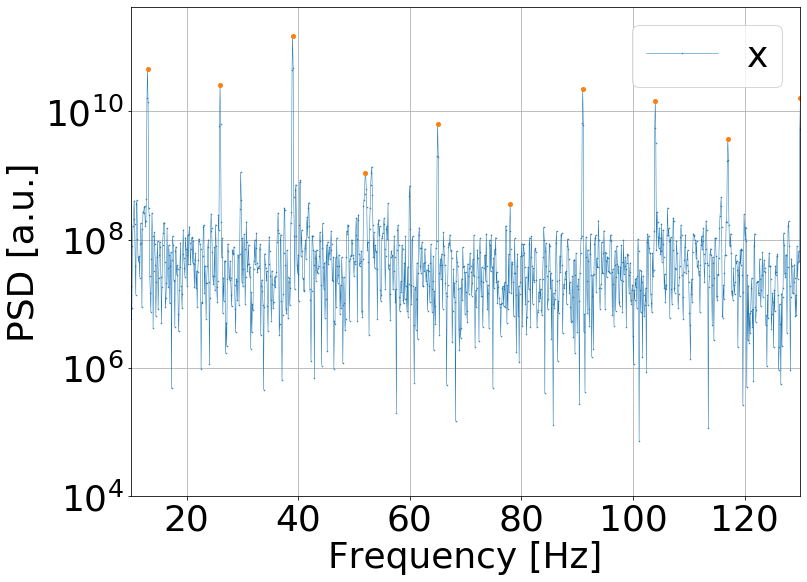

In [11]:
freqharm,harmonics=get_harmonics(xpsd,13,10,res_factor=10,plot=False)
_,ax = plt.subplots()
ax.semilogy(freqs, xpsd, '.-', label="x",markersize=1,linewidth=0.5)
ax.semilogy(freqharm,harmonics,markersize=4,marker="o",linestyle="")
#ax.semilogy(freqs, ypsd, '.-', label="y*1",markersize=1,linewidth=0.5)
#ax.semilogy(freqs, zpsd, '.-', label="z*100",markersize=1,linewidth=0.5)
ax.legend()
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel('PSD [a.u.]')
plt.xlim(10,130)
plt.ylim(1e4,1/10*np.max(ypsd))
plt.grid(True)
print(freqs[np.argmax(xpsd)], "maximum x")
print(freqs[np.argmax(ypsd)], "maximum y")
print(np.min(xpsd), "minimum x")
print(np.min(ypsd), "minimum y")


In [12]:
height_list = [42,42,42,50,42,42,50,42,40,40,40,42,42,42,42,42,42]
voltage_shield = [-5,-8.375,-10,-12,-12,-14,-14,-10,-10,-10,-10,-10,-10,-14,-14,-14,-14]
files_of_interest = [1,5,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23]



In [13]:
folder_shaking = "/Shaking/"
folder = folder_basic + folder_shaking
files = load_dir_sorted(folder, file_prefix = 'Shaking', max_file=25)
harmonic_list =[]
for i in files_of_interest:
    print(files[i-1].fname)
    data = files[i-1].xyz2
    data_det=signal.detrend(data)
    x=data_det[0]
    y=data_det[1]
    z=data_det[2]
    res = res
    fsamp = 5000 # stays hard coded for now
    xpsd, freqs = matplotlib.mlab.psd(x, Fs = fsamp, NFFT = res)
    ypsd, freqs = matplotlib.mlab.psd(y, Fs = fsamp, NFFT = res)
    zpsd, freqs = matplotlib.mlab.psd(z, Fs = fsamp, NFFT = res)
    freqs,harmonics = get_harmonics(xpsd,shake_freq=13,no_harmonics=10)
    harmonic_list.append(harmonics)


23  files in folder
23  files loaded
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking1_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking5_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking9_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking10_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking11_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking12_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking13_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking14_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking15_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking16_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking17_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/Shaking/Shaking18_0.h5
/home/data_transfer/data_from_windows/20191114/Bead1/S

In [14]:
sum_list = []
mean_list=[]
std_list = []
for entry in harmonic_list:
    sum_list.append(np.sum(entry))
    mean_list.append(np.mean(entry))
    std_list.append(np.std(entry))

In [15]:
plot_height_test = np.arange(1,len(files_of_interest)+1,1)

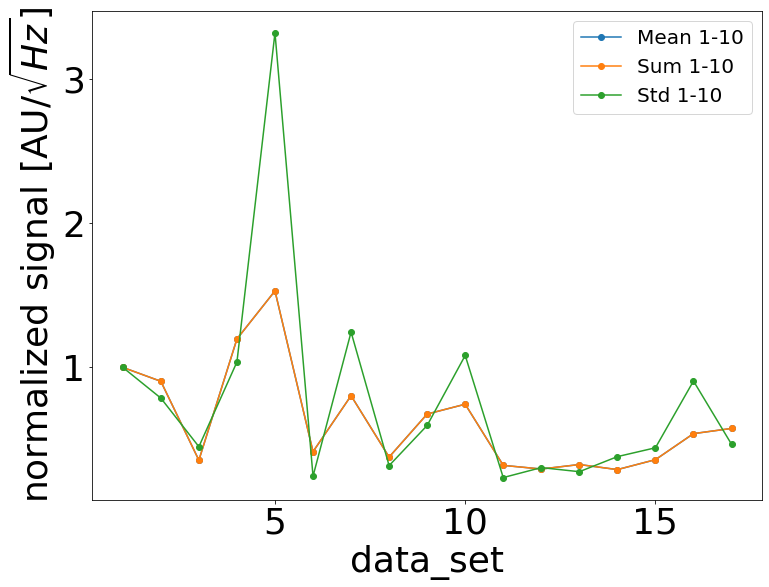

'\nShaking 1 y 2V amp, 13 Hz, 100 s\nShaking 5 as before, z is -8.375 V\nShaking 9 as before, z i -10V (30s)\nShaking 10 z -12 V, 30 s aerotech z is 50 um\nShaking 11 z -12 V, 30 s, aerotech z is 42 um. \nShaking 12,13 z -14\nShaking 14 z -10 V aerotech z is 50 um\nShaking 15 z -10 V, aerotech z is 42 um\nShaking 16,17 z -10 V, aerotech z is 40 um\nShaking 18,19 y center is 218 um\nShaking 20,21 z -14 V, aerotech z 42 um, aerotech x 360.5. \nShaking 22,23 aerotech x 365.5 um\n'

In [16]:
plt.plot(plot_height_test,mean_list/mean_list[0],marker="o",linestyle="-", label="Mean 1-10")
plt.plot(plot_height_test,sum_list/sum_list[0],marker="o",linestyle="-", label="Sum 1-10")
plt.plot(plot_height_test,std_list/std_list[0],marker="o",linestyle="-", label="Std 1-10")

plt.ylabel(r"normalized signal [AU/$\sqrt{Hz}$]")
plt.xlabel("data_set")
#plt.yscale("log")
plt.legend(fontsize=20)
#plt.savefig("Results/height_campaign.png", dpi=300, bbox_inch ="tight")
plt.show()
"""
Shaking 1 y 2V amp, 13 Hz, 100 s
Shaking 5 as before, z is -8.375 V
Shaking 9 as before, z i -10V (30s)
Shaking 10 z -12 V, 30 s aerotech z is 50 um
Shaking 11 z -12 V, 30 s, aerotech z is 42 um. 
Shaking 12,13 z -14
Shaking 14 z -10 V aerotech z is 50 um
Shaking 15 z -10 V, aerotech z is 42 um
Shaking 16,17 z -10 V, aerotech z is 40 um
Shaking 18,19 y center is 218 um
Shaking 20,21 z -14 V, aerotech z 42 um, aerotech x 360.5. 
Shaking 22,23 aerotech x 365.5 um
"""

# Process files only for harmonics using psd

In [ ]:
     FreqTF,TF = transfer_func_output(folder,q,V,no_harmonics=no_harmonics_tf)
        TF_val = transfer_function_fits(FreqTF,TF)
        file_amp_list = []
        file_phase_list = []
        for data_set in tqdm(data_set_list):
            fname = data_set#folder+"/Bead"+str(BeadNumber)+"/Shaking"+"/Shaking%d_%d.h5" % (data_set,0)
            BDF = BeadDataFile.BeadDataFile(fname)
            data = BDF.xyz2
            res = 50000
            fsamp=5000
            

            # now get amplitude and phase from all harmonics

            no_harmonics=np.arange(1,100,1)
            norm_factor = 10
            frequency=13
            response_amp=[]
            response_phase = []
            for i in no_harmonics:
                a = xnsd[i*shake_freq*norm_factor] * np.cos(xphase[i*shake_freq*norm_factor]) 
                b = xnsd[i*shake_freq*norm_factor] * np.sin(xphase[i*shake_freq*norm_factor])
                response_amp.append(a)
                response_phase.append(b)
            file_amp_list.append(response_amp)
            file_phase_list.append(response_phase)
        return file_amp_list,file_phase_list

In [114]:
def harmonics_processor2(folder,max_file=5,shake_freq=13,no_harmonics=10,fsamp=5000,res=50000,res_factor=10,save_file=True):
    #path="/harmonics/"
    #try:
    #    os.mkdir(path)
    #except OSError:
    #    print ("Creation of the directory %s failed" % path)
    #else:
    #    print ("Successfully created the directory %s " % path)
    print("test")
    files = load_dir_sorted(folder, file_prefix = 'Shaking', max_file=max_file)
    harmonic_list =[]
    phase_list = []
    xmean_list,ymean_list,zmean_list = ([] for i in range(3))
    cant_xpos_list,cant_ypos_list,cant_zpos_list=([] for i in range(3))                
    for i in tqdm(np.arange(0,max_file,1)):
        #print(files[i].fname)
        data = files[i].xyz2
        xmean_list.append(np.mean(files[i].x2))
        ymean_list.append(np.mean(files[i].y2))
        zmean_list.append(np.mean(files[i].z2))
        cant_xpos_list.append(np.mean(files[i].cant_pos[0]))
        cant_ypos_list.append(np.mean(files[i].cant_pos[1]))
        cant_zpos_list.append(np.mean(files[i].cant_pos[2]))
        data_det=signal.detrend(data)
        x=data_det[0]
        y=data_det[1]
        z=data_det[2]
        res = res
        fsamp = fsamp # stays hard coded for now
        freqs=np.linspace(0,fsamp/2,(res/2)+1)    # change

        xFFT=np.fft.rfft(data_det[0])
        yFFT=np.fft.rfft(data_det[1])
        zFFT=np.fft.rfft(data_det[2])
        norm = np.sqrt(2 / (res* fsamp))
        xpsd = norm**2 * (xFFT * xFFT.conj()).real
        ypsd = norm**2 * (yFFT * yFFT.conj()).real
        zpsd = norm**2 * (zFFT * zFFT.conj()).real
        freqs,harmonics = get_harmonics(xpsd,shake_freq=shake_freq,no_harmonics=no_harmonics)
        harmonic_list.append(np.sqrt(harmonics))                           
        xphase=np.angle(xFFT)
        yphase=np.angle(yFFT)
        zphase=np.angle(zFFT)
        freqs,phases = get_harmonics(xphase,shake_freq=shake_freq,no_harmonics=no_harmonics)
        phase_list.append(phases)
        
        
    #df = pd.DataFrame(harmonic_list)
    #df["x_mean"]=xmean_list
    #df["y_mean"]=ymean_list
    #df["z_mean"]=zmean_list
    #df["attractor_position_x"]=cant_xpos_list
    #df["attractor_position_y"]=cant_ypos_list
    #df["attractor_position_z"]=cant_zpos_list
    if(save_file==True):
        df.to_csv(folder+"harmonics/harmonics_basic_1000.csv",index=False)
    return phase_list

In [57]:
def harmonics_processor(folder,max_file=5,shake_freq=13,no_harmonics=10,fsamp=5000,res=50000,res_factor=10,save_file=True):
    #path="/harmonics/"
    #try:
    #    os.mkdir(path)
    #except OSError:
    #    print ("Creation of the directory %s failed" % path)
    #else:
    #    print ("Successfully created the directory %s " % path)
    print("test")
    files = load_dir_sorted(folder, file_prefix = 'Shaking', max_file=max_file)
    harmonic_list =[]
    xmean_list,ymean_list,zmean_list = ([] for i in range(3))
    cant_xpos_list,cant_ypos_list,cant_zpos_list=([] for i in range(3))                
    for i in tqdm(np.arange(0,max_file,1)):
        #print(files[i].fname)
        data = files[i].xyz2
        xmean_list.append(np.mean(files[i].x2))
        ymean_list.append(np.mean(files[i].y2))
        zmean_list.append(np.mean(files[i].z2))
        cant_xpos_list.append(np.mean(files[i].cant_pos[0]))
        cant_ypos_list.append(np.mean(files[i].cant_pos[1]))
        cant_zpos_list.append(np.mean(files[i].cant_pos[2]))
        data_det=signal.detrend(data)
        x=data_det[0]
        y=data_det[1]
        z=data_det[2]
        res = res
        fsamp = fsamp # stays hard coded for now
        xpsd, freqs = matplotlib.mlab.psd(x, Fs = fsamp, NFFT = res)
        ypsd, freqs = matplotlib.mlab.psd(y, Fs = fsamp, NFFT = res)
        zpsd, freqs = matplotlib.mlab.psd(z, Fs = fsamp, NFFT = res)
        freqs,harmonics = get_harmonics(xpsd,shake_freq=shake_freq,no_harmonics=no_harmonics)
        harmonic_list.append(np.sqrt(harmonics))
    df = pd.DataFrame(harmonic_list)
    df["x_mean"]=xmean_list
    df["y_mean"]=ymean_list
    df["z_mean"]=zmean_list
    df["attractor_position_x"]=cant_xpos_list
    df["attractor_position_y"]=cant_ypos_list
    df["attractor_position_z"]=cant_zpos_list
    if(save_file==True):
        df.to_csv(folder+"harmonics/harmonics_basic_1000.csv",index=False)
    return df

In [117]:
folder_shaking = "/Shaking/Shaking24/"
folder = folder_basic + folder_shaking
phase_test1 = harmonics_processor2(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10,save_file=False)
folder_shaking = "/Shaking/Shaking25/"
folder = folder_basic + folder_shaking
phase_test2 = harmonics_processor2(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10,save_file=False)
folder_shaking = "/Shaking/Shaking28/"
folder = folder_basic + folder_shaking
phase_test3 = harmonics_processor2(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10,save_file=False)


test


  0%|          | 3/1000 [00:00<00:33, 29.62it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:14<00:00, 67.63it/s]


test


  0%|          | 5/1000 [00:00<00:19, 49.78it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:15<00:00, 66.41it/s]


test


  1%|          | 8/1000 [00:00<00:12, 78.39it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:15<00:00, 65.79it/s]


In [156]:
phase_test3 = np.swapaxes(phase_test3,0,1)


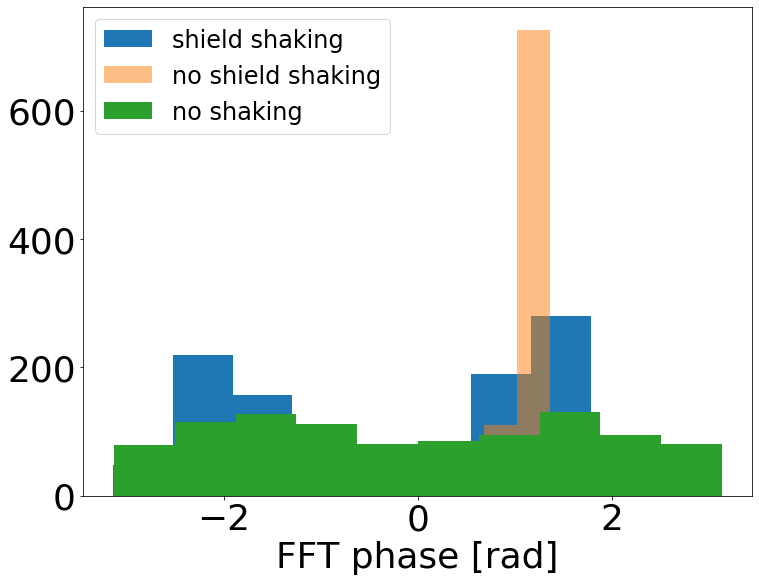

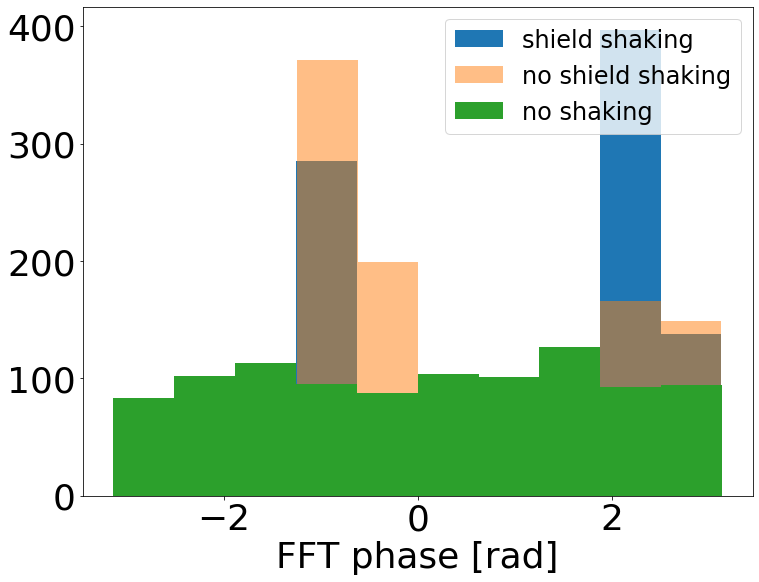

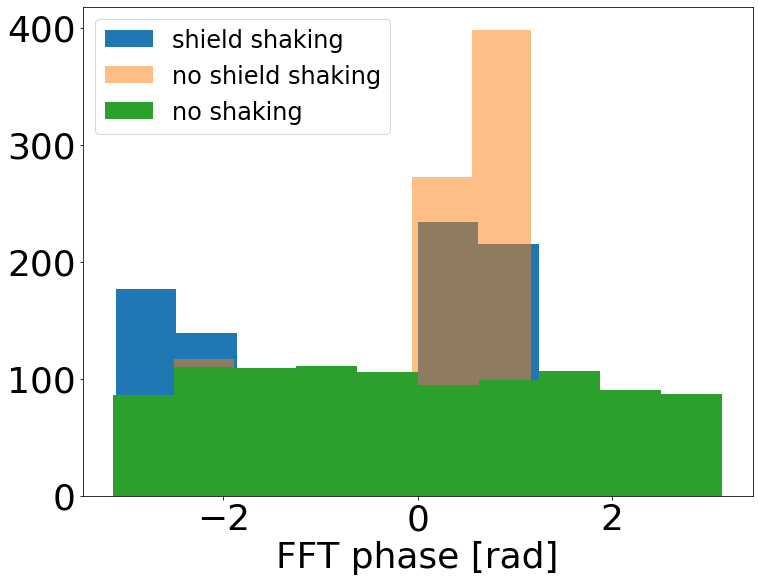

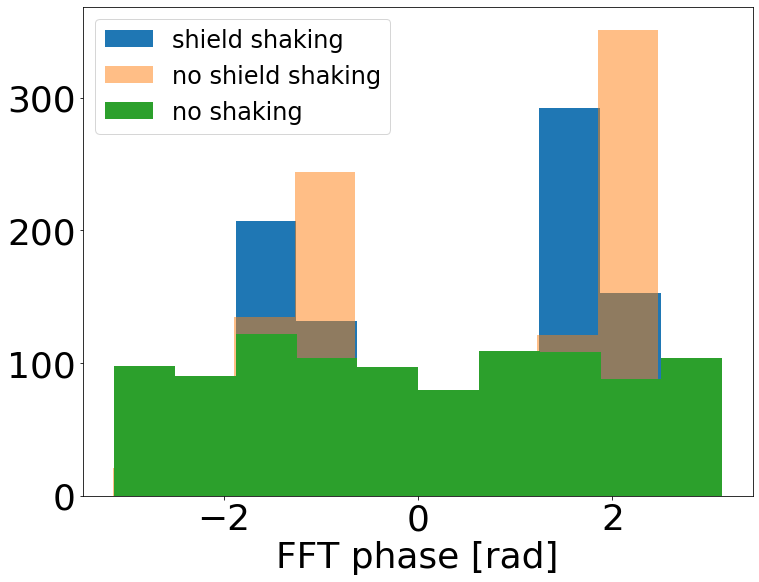

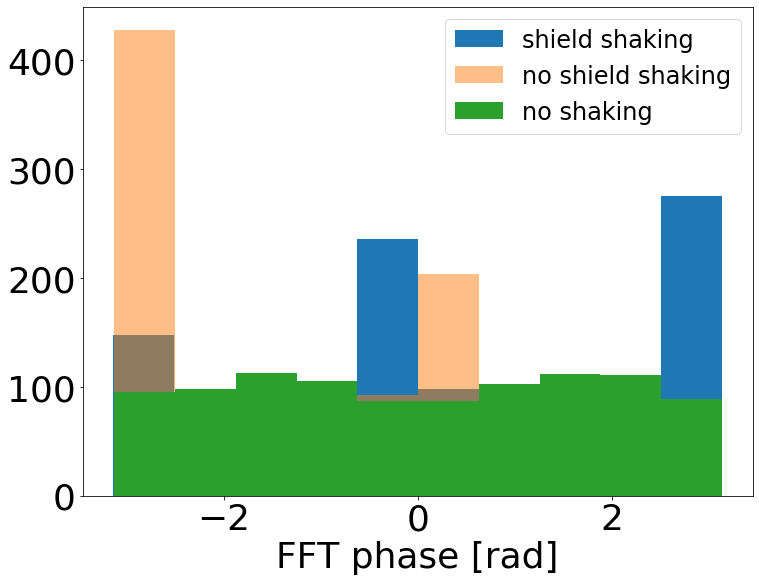

...

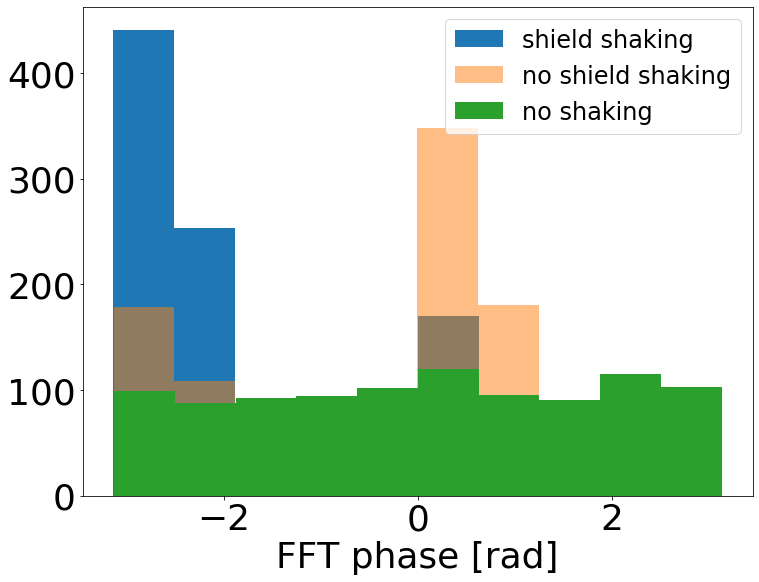

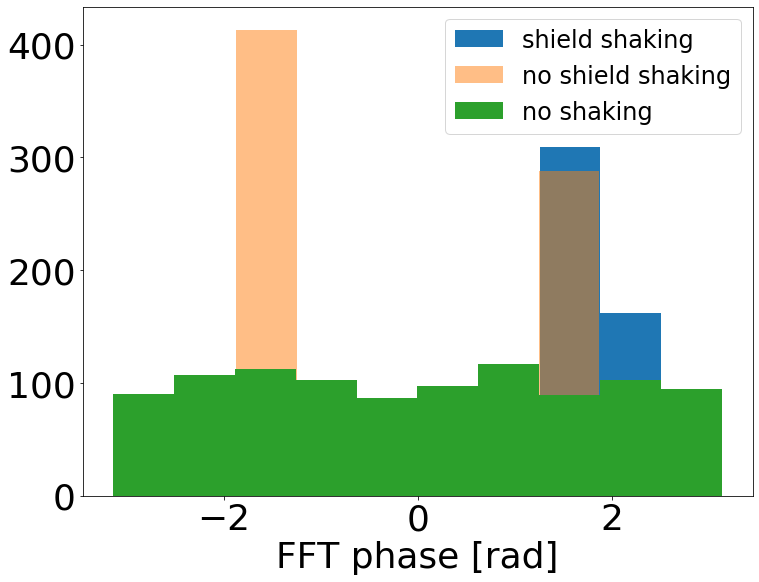

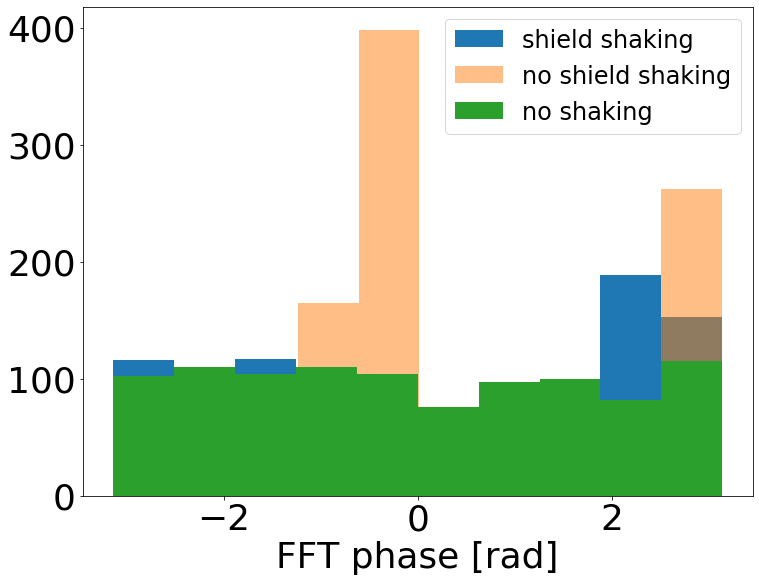

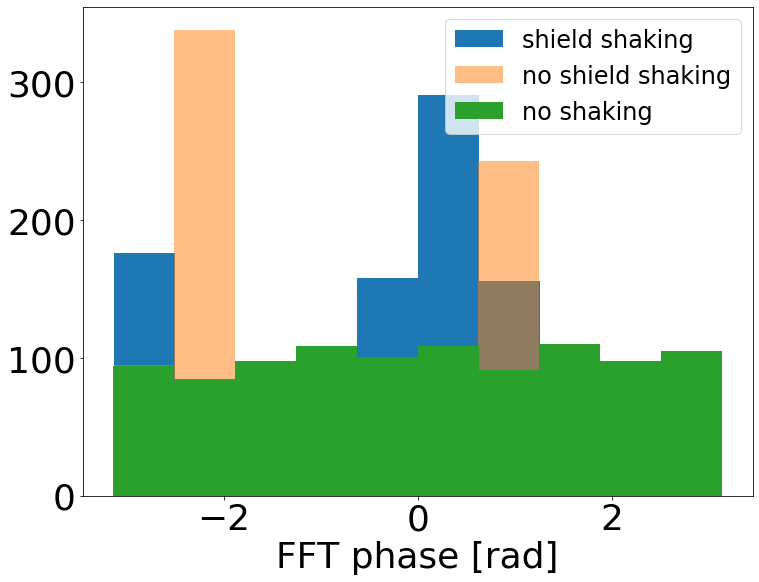

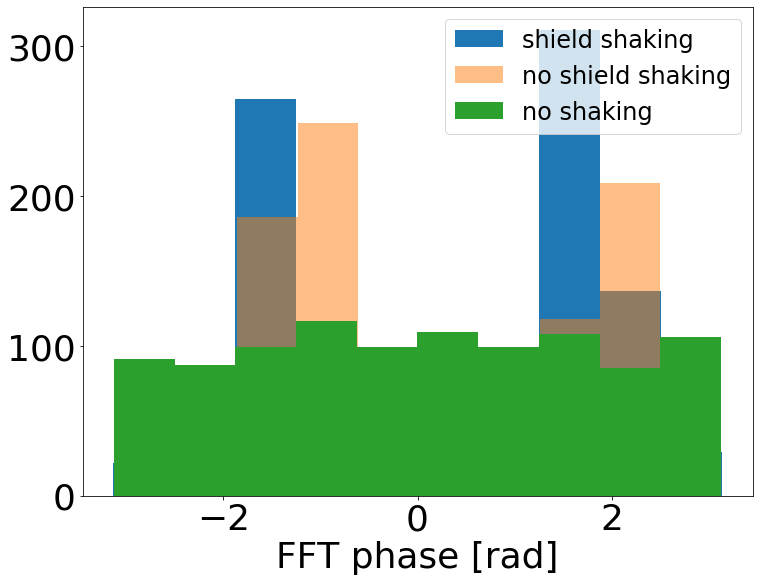

In [180]:
for i in np.arange(0,15,1):
    plt.hist(phase_test1[i], label = "shield shaking")
    plt.hist(phase_test2[i], label = "no shield shaking",alpha=0.5)
    plt.hist(phase_test3[i], label = "no shaking")
    plt.legend(fontsize =24)
    plt.xlabel("FFT phase [rad]")
    plt.savefig("Results/histo_phase_%d" %i, bbox_inches = "tight")
    plt.show()

In [58]:
folder_shaking = "/Shaking/Shaking24/"
folder = folder_basic + folder_shaking
df_shaking24 = harmonics_processor(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10)

test


  0%|          | 5/1000 [00:00<00:20, 47.41it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:19<00:00, 50.13it/s]


In [59]:
folder_shaking = "/Shaking/Shaking25/"
folder = folder_basic + folder_shaking
df_shaking25 = harmonics_processor(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10)

test


  0%|          | 5/1000 [00:00<00:20, 49.01it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:19<00:00, 52.37it/s]


In [60]:
folder_shaking = "/Shaking/Shaking26/"
folder = folder_basic + folder_shaking
df_shaking26 = harmonics_processor(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10)

test


  0%|          | 4/1000 [00:00<00:27, 35.58it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:19<00:00, 51.38it/s]


In [61]:
folder_shaking = "/Shaking/Shaking27/"
folder = folder_basic + folder_shaking
df_shaking27 = harmonics_processor(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10)

test


  1%|          | 6/1000 [00:00<00:19, 51.14it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:19<00:00, 50.62it/s]


In [62]:
folder_shaking = "/Shaking/Shaking28/"
folder = folder_basic + folder_shaking
df_shaking28 = harmonics_processor(folder,max_file=1000,shake_freq=13,no_harmonics=15,res_factor=10)

test


  0%|          | 5/1000 [00:00<00:21, 45.27it/s]

1000  files in folder
1000  files loaded


100%|██████████| 1000/1000 [00:20<00:00, 51.70it/s]


In [67]:
# load for string conversion and to test its running

folder_shaking = "/Shaking/Shaking28/"
folder = folder_basic + folder_shaking
df_shaking28 = pd.read_csv(folder+"harmonics/harmonics_basic_1000.csv")

In [68]:
mean24,std24, sum24, median24 = get_mean_std_sum_of_harmonics(df_shaking24,no_harmonics=15)
mean25,std25, sum25, median25 = get_mean_std_sum_of_harmonics(df_shaking25,no_harmonics=15)
mean26,std26, sum26, median26 = get_mean_std_sum_of_harmonics(df_shaking26,no_harmonics=15)
mean27,std27, sum27, median27 = get_mean_std_sum_of_harmonics(df_shaking27,no_harmonics=15)
mean28,std28, sum28, median28 = get_mean_std_sum_of_harmonics(df_shaking28,no_harmonics=15)




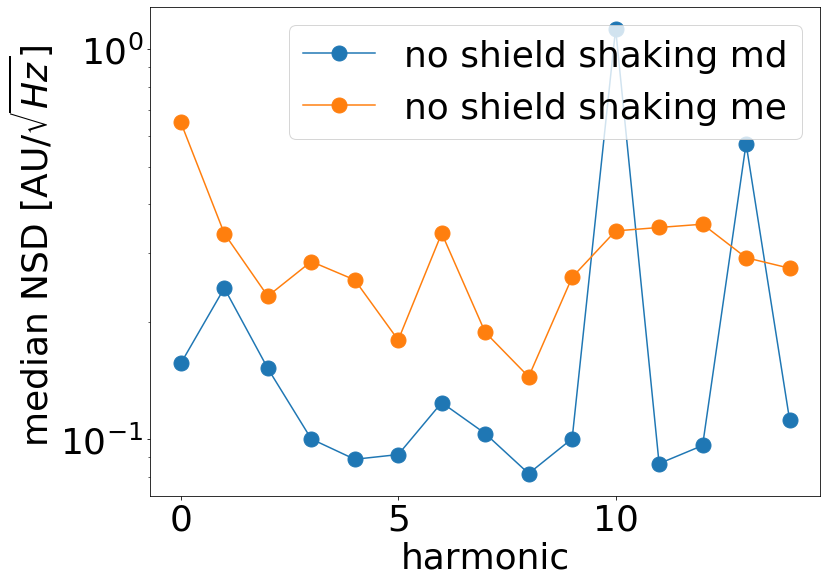

In [69]:
plt.plot(np.arange(0,15,1),sum24,marker="o",linestyle="-",markersize="15", label = "no shield shaking md")
plt.plot(np.arange(0,15,1),sum25,marker="o",linestyle="-",markersize="15", label = "no shield shaking me")

#plt.plot(np.arange(0,15,1),np.divide(mean26,std26),marker="o",linestyle="", label = "servo on")
#plt.plot(np.arange(0,15,1),np.divide(mean27,std27),marker="o",linestyle="", label = "no servo")
#plt.plot(np.arange(0,15,1),median28,marker="o",linestyle="",markersize="15", label = "no shaking")
plt.legend()
plt.yscale("log")
plt.ylabel(r" median NSD [AU/$\sqrt{Hz}$]")
plt.xlabel("harmonic")
plt.show()

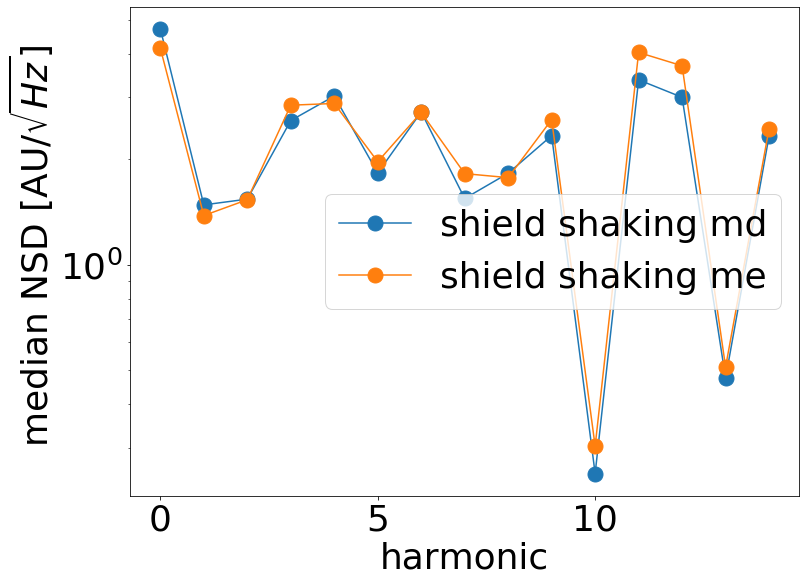

In [70]:
plt.plot(np.arange(0,15,1),np.divide(median25,median24),marker="o",linestyle="-", markersize="15",label ="shield shaking md")
#plt.plot(np.arange(0,15,1),median25,marker="o",linestyle="-",markersize="15", label = "no shield shaking md")
plt.plot(np.arange(0,15,1),np.divide(mean25,mean24),marker="o",linestyle="-", markersize="15",label ="shield shaking me")
#plt.plot(np.arange(0,15,1),mean25,marker="o",linestyle="-",markersize="15", label = "no shield shaking me")

#plt.plot(np.arange(0,15,1),np.divide(mean26,std26),marker="o",linestyle="", label = "servo on")
#plt.plot(np.arange(0,15,1),np.divide(mean27,std27),marker="o",linestyle="", label = "no servo")
#plt.plot(np.arange(0,15,1),median28,marker="o",linestyle="",markersize="15", label = "no shaking")
plt.legend()
plt.yscale("log")
plt.ylabel(r" median NSD [AU/$\sqrt{Hz}$]")
plt.xlabel("harmonic")
plt.show()

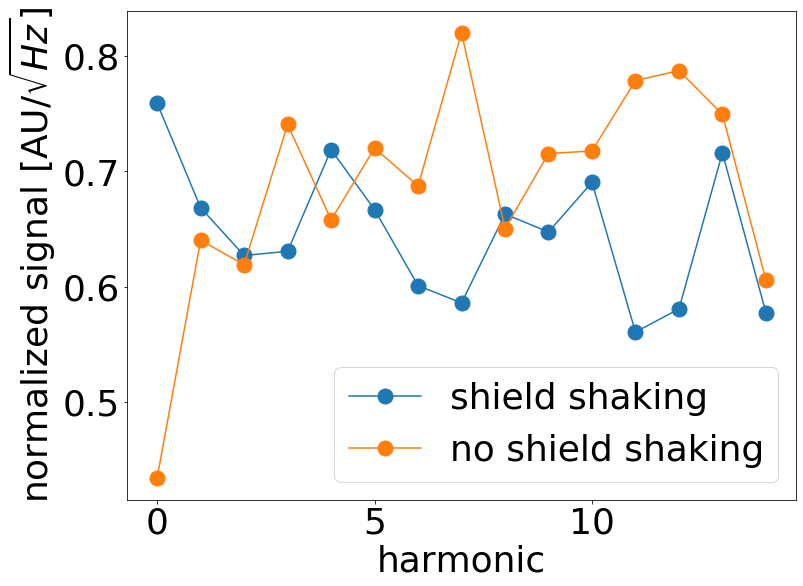

In [71]:
plt.plot(np.arange(0,15,1),np.divide(std24,mean24),marker="o",linestyle="-", markersize="15",label ="shield shaking")
plt.plot(np.arange(0,15,1),np.divide(std25,mean25),marker="o",linestyle="-",markersize="15", label = "no shield shaking")
#plt.plot(np.arange(0,15,1),np.divide(mean26,std26),marker="o",linestyle="", label = "servo on")
#plt.plot(np.arange(0,15,1),np.divide(mean27,std27),marker="o",linestyle="", label = "no servo")
#plt.plot(np.arange(0,15,1),np.divide(std28,mean28),marker="o",linestyle="",markersize="15", label = "no shaking")
plt.legend()
plt.ylabel(r"normalized signal [AU/$\sqrt{Hz}$]")
plt.xlabel("harmonic")
plt.show()

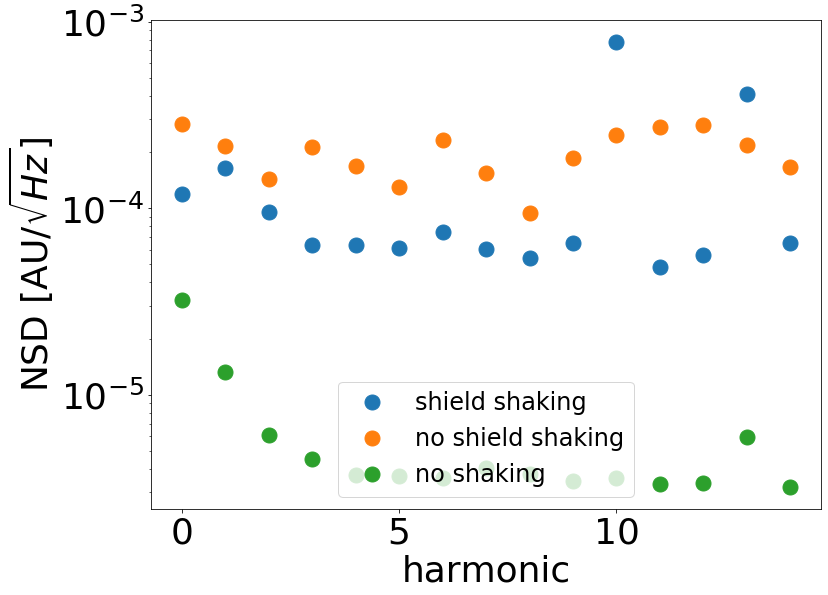

In [72]:
plt.plot(np.arange(0,15,1),std24,marker="o",linestyle="",  markersize="15", label ="shield shaking")
plt.plot(np.arange(0,15,1),std25,marker="o",linestyle="",  markersize="15", label = "no shield shaking")
#plt.plot(np.arange(0,15,1),std26,marker="o",linestyle="", label = "servo on")
#plt.plot(np.arange(0,15,1),std27,marker="o",linestyle="", label = "no servo")
plt.plot(np.arange(0,15,1),std28,marker="o",linestyle="",  markersize="15", label = "no shaking")
plt.ylabel("NSD [AU/$\sqrt{Hz}$]")
plt.xlabel("harmonic")
plt.legend(fontsize=24, loc=8)
plt.yscale("log")
plt.savefig("Results/std_dev.png", dpi=300, bbox_inches ="tight")
plt.show()

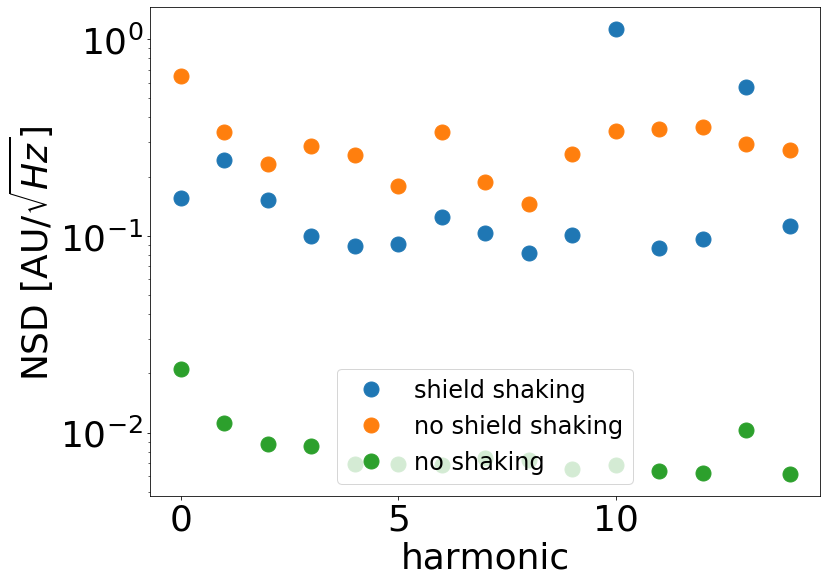

In [73]:
plt.plot(np.arange(0,15,1),sum24,marker="o",linestyle="",  markersize="15",label ="shield shaking")
plt.plot(np.arange(0,15,1),sum25,marker="o",linestyle="", markersize="15", label = "no shield shaking")
#plt.plot(np.arange(0,15,1),sum26,marker="o",linestyle="", label = "servo on")
#plt.plot(np.arange(0,15,1),sum27,marker="o",linestyle="", label = "no servo")
plt.plot(np.arange(0,15,1),sum28,marker="o",linestyle="",  markersize="15",label = "no shaking")
plt.ylabel("NSD [AU/$\sqrt{Hz}$] ")
plt.xlabel("harmonic")
plt.legend(fontsize=24, loc=8)
plt.yscale("log")
plt.savefig("Results/sum.png", dpi=300, bbox_inches ="tight")
plt.show()

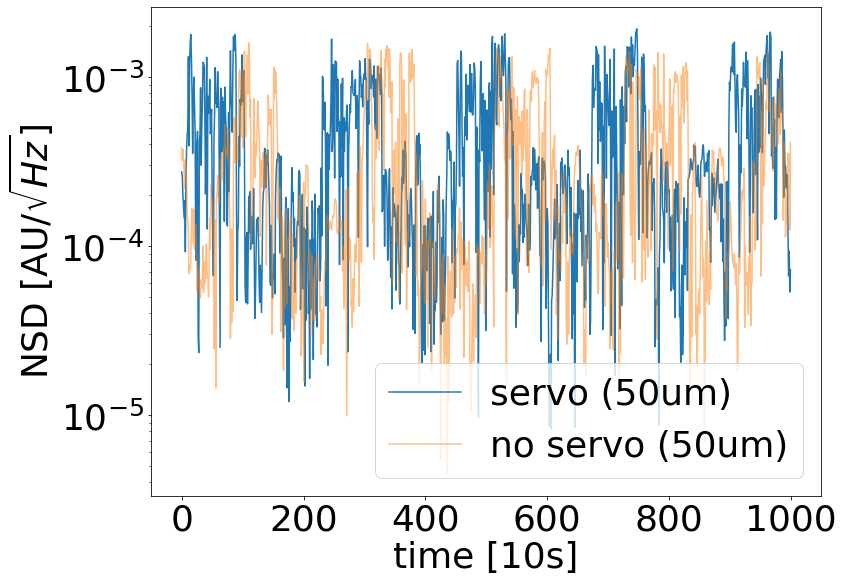

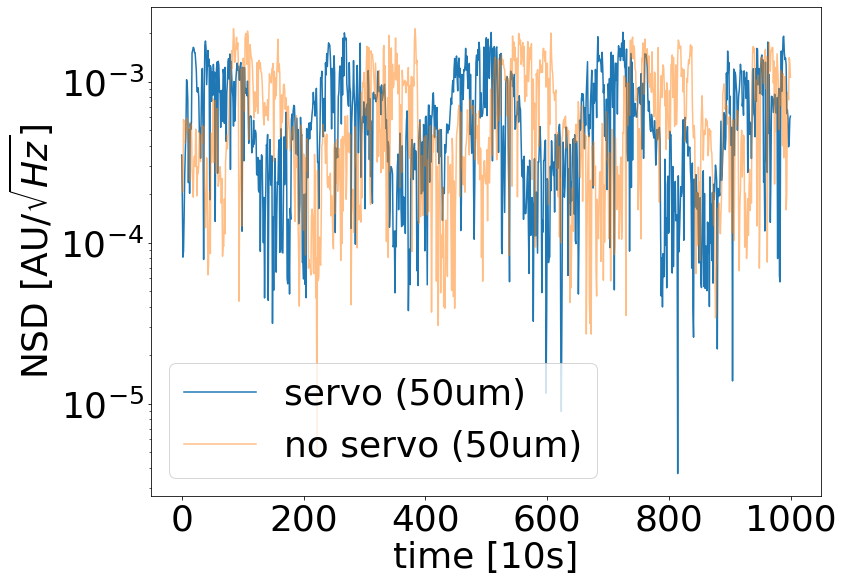

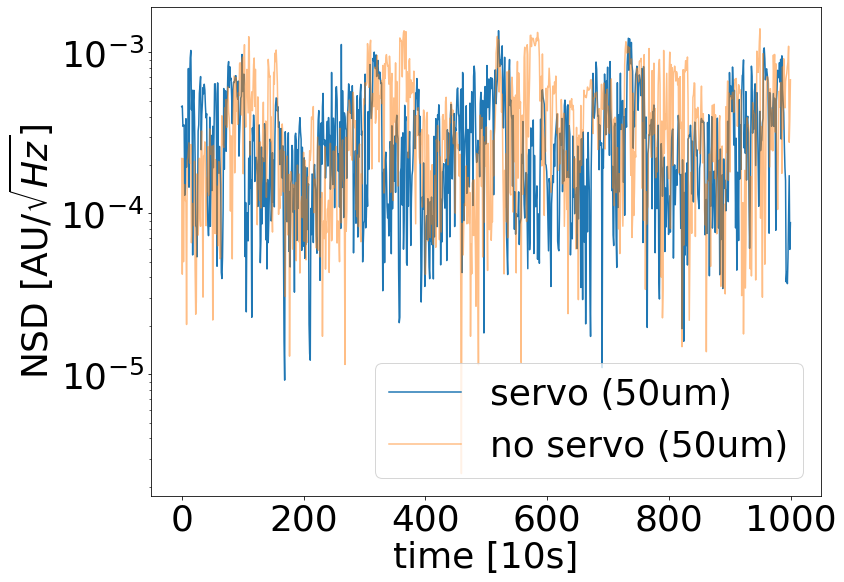

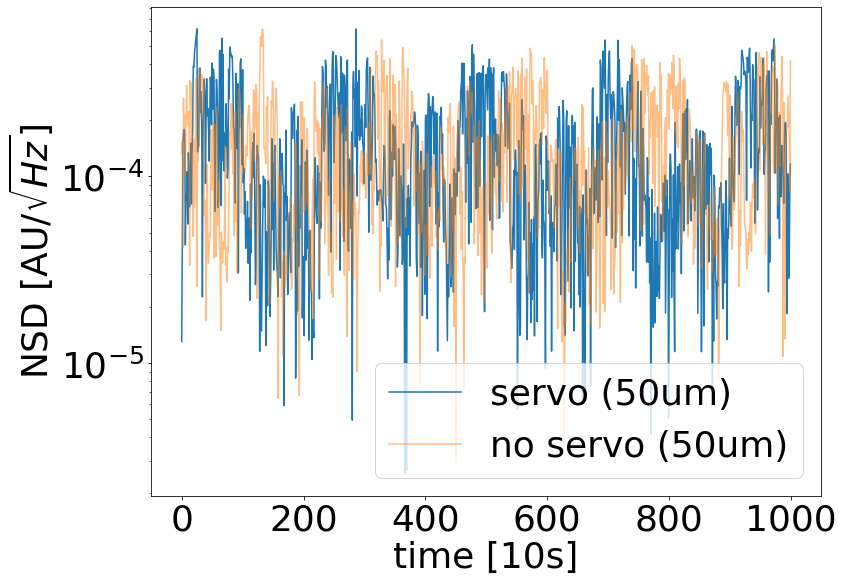

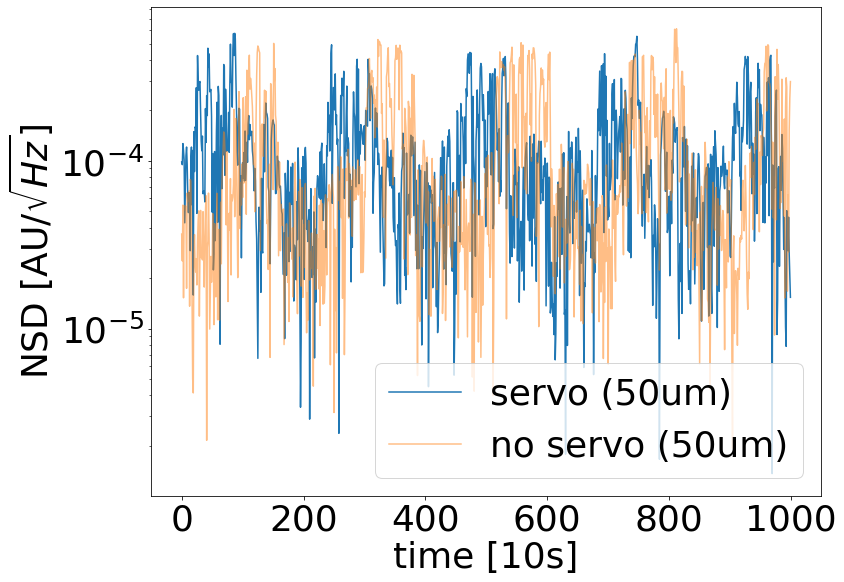

...

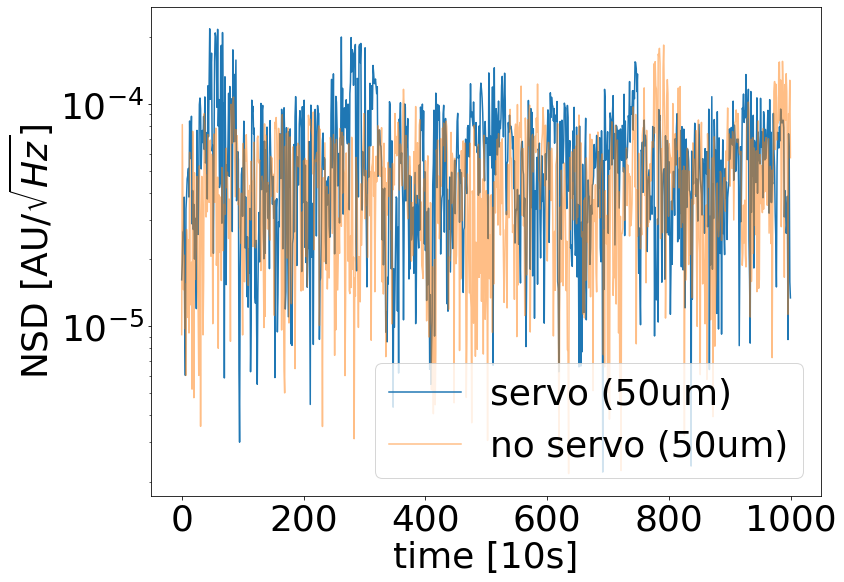

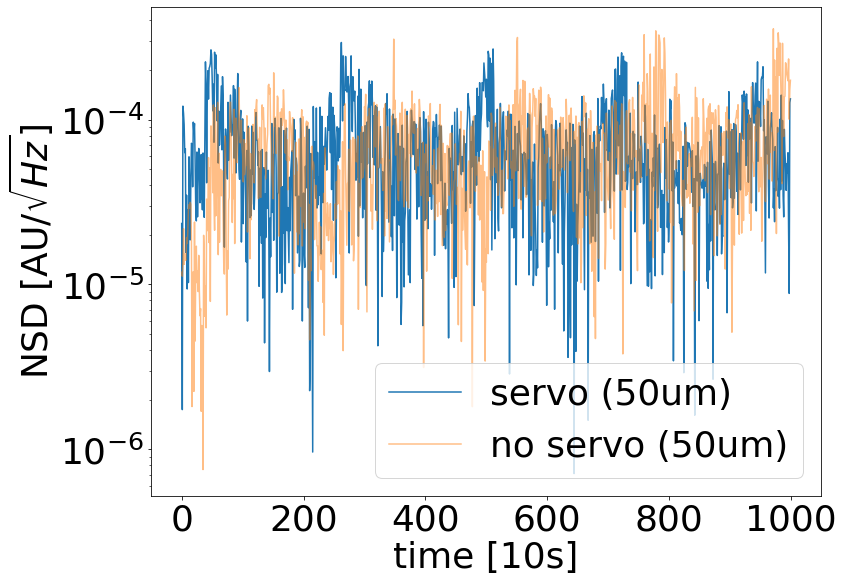

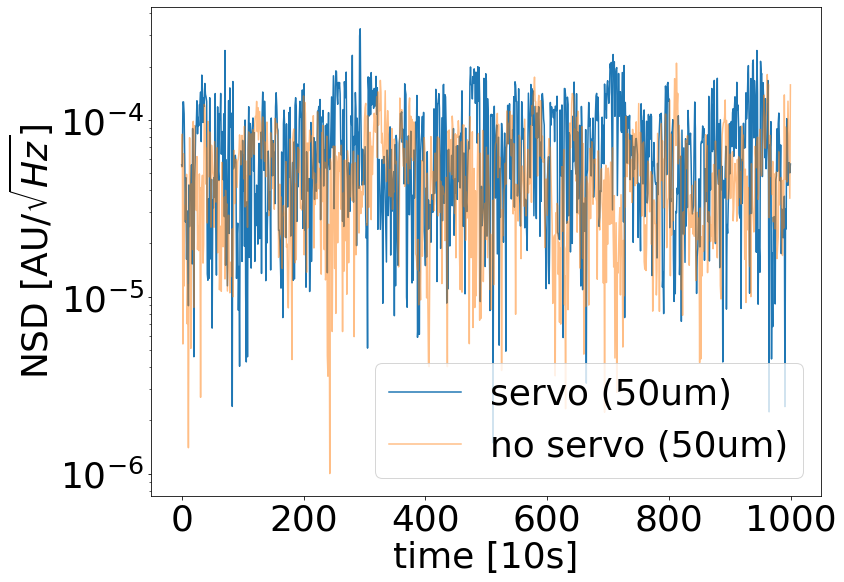

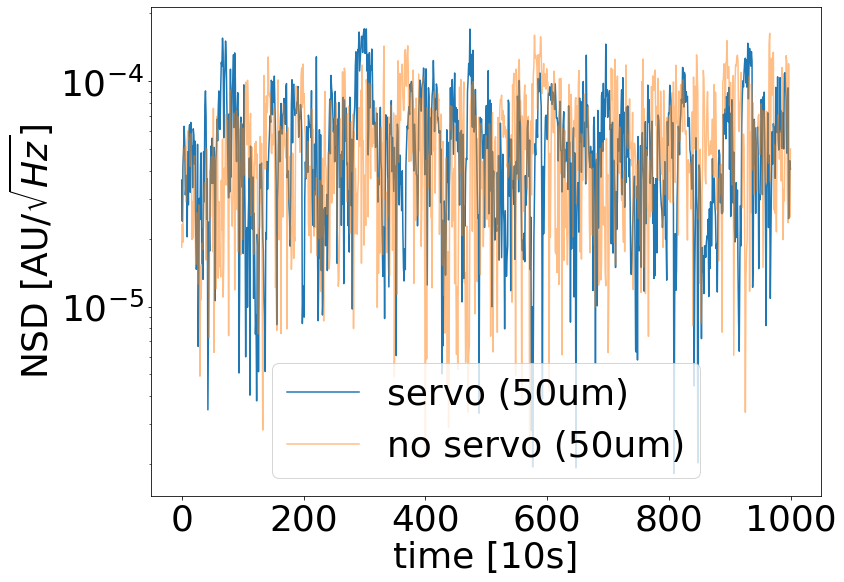

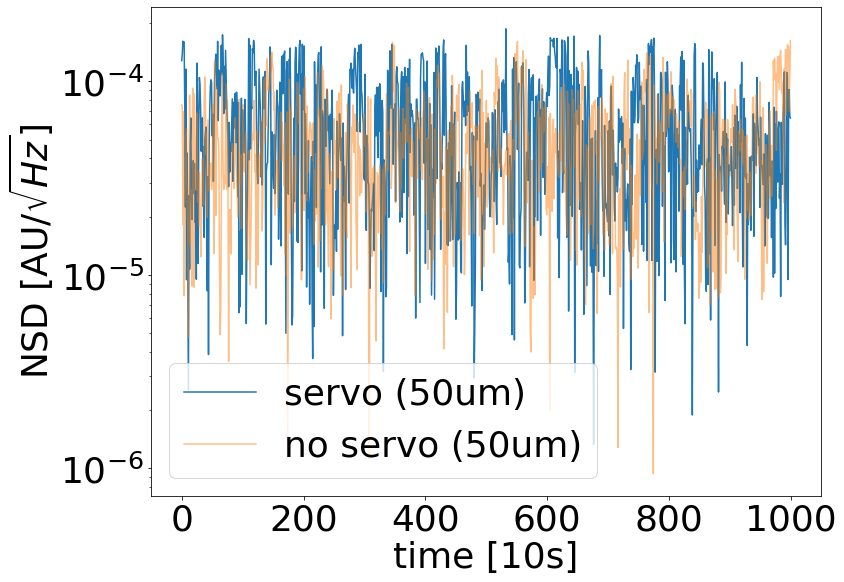

In [74]:
for i in np.arange(0,15,1):
    harmonic = i
    plt.plot(df_shaking26["%d" %harmonic], label = "servo (50um)")
    plt.plot(df_shaking27["%d" %harmonic], label = "no servo (50um)",alpha=0.5)
    plt.legend()
    plt.ylabel(r"NSD [AU/$\sqrt{Hz}$]")
    plt.xlabel("time [10s]")
    plt.yscale("log")
    plt.savefig("Results/%d_harmonic_servo.png" %harmonic, dpi=300, bbox_inches ="tight")
    plt.show()

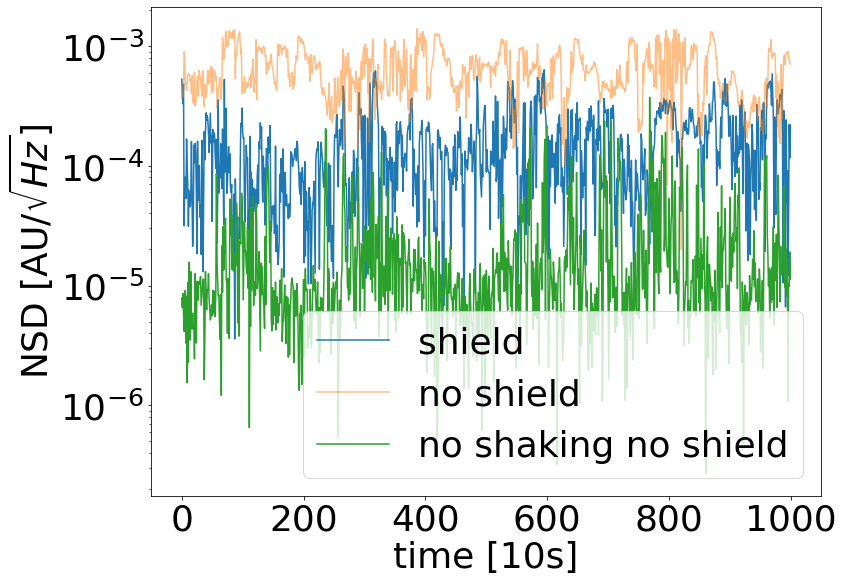

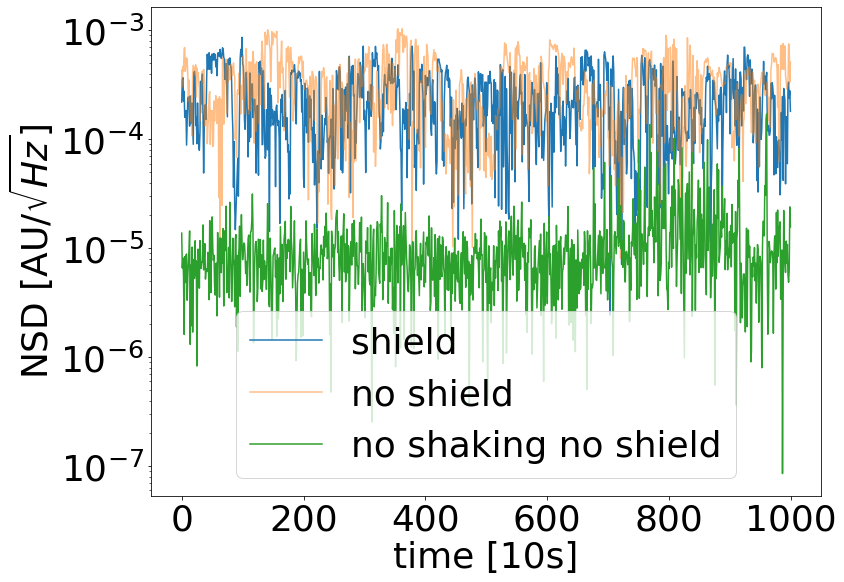

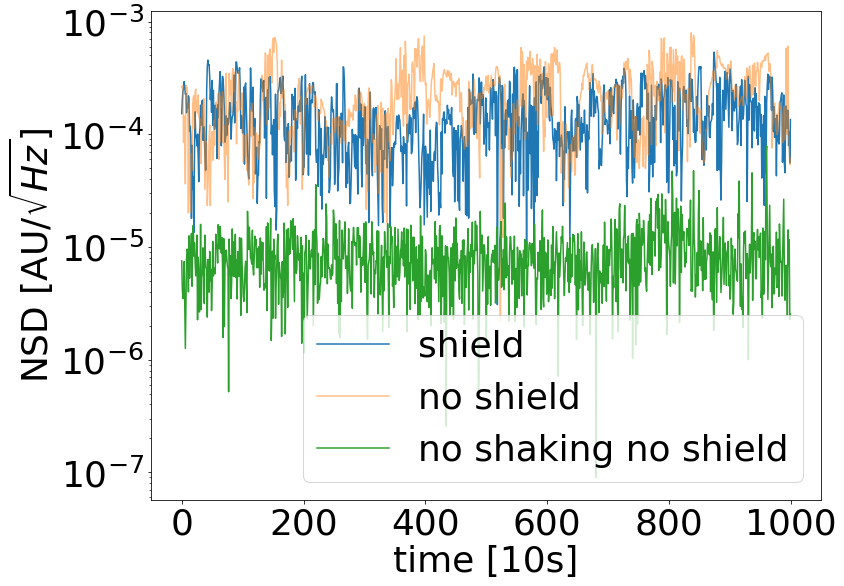

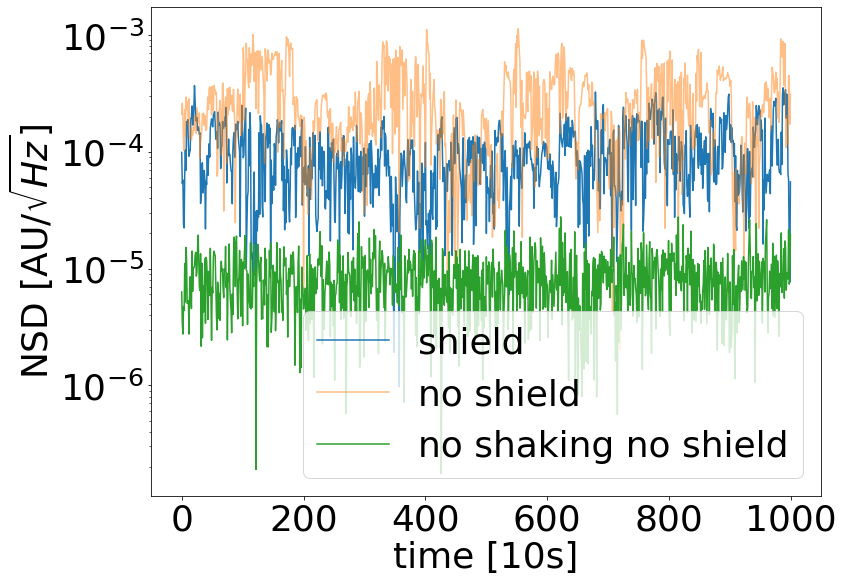

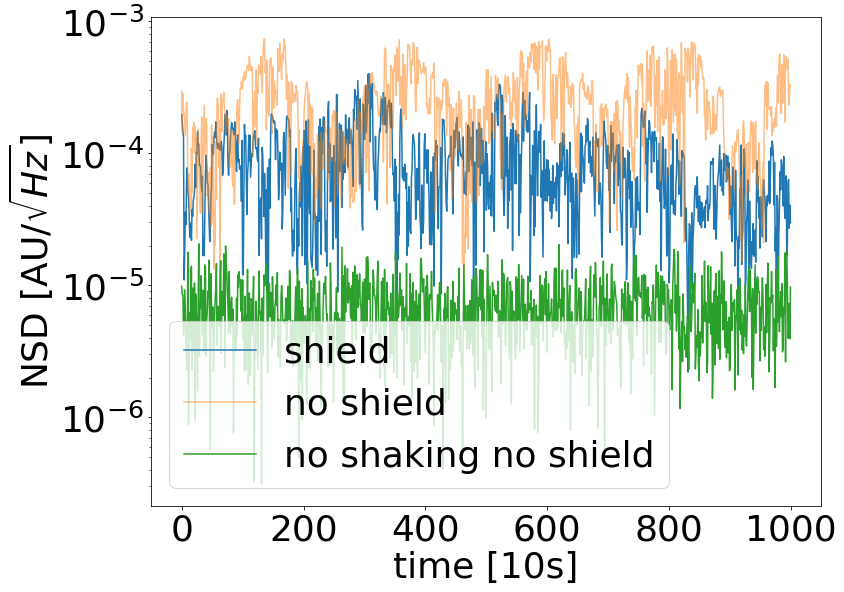

...

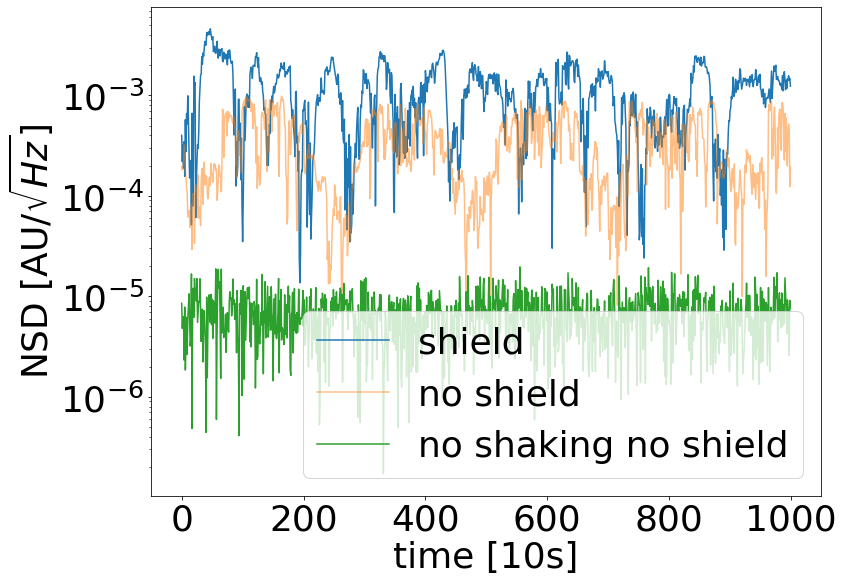

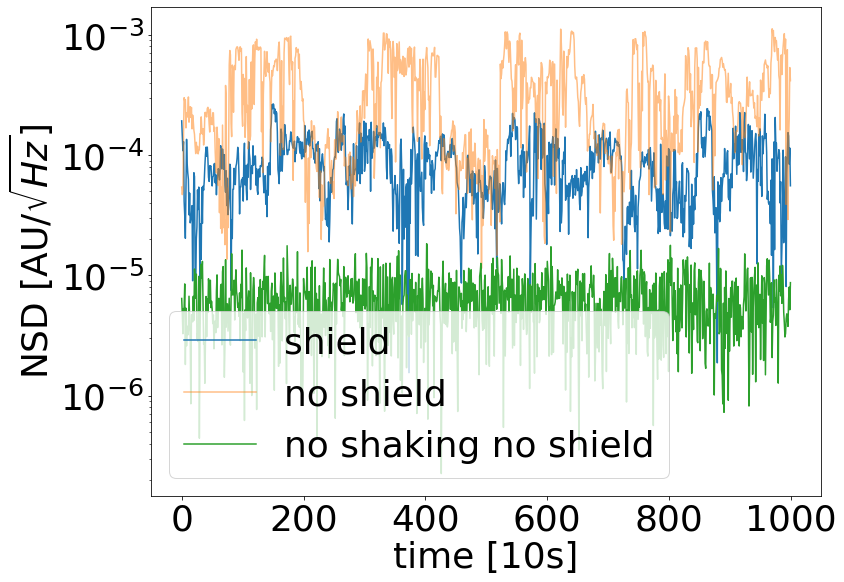

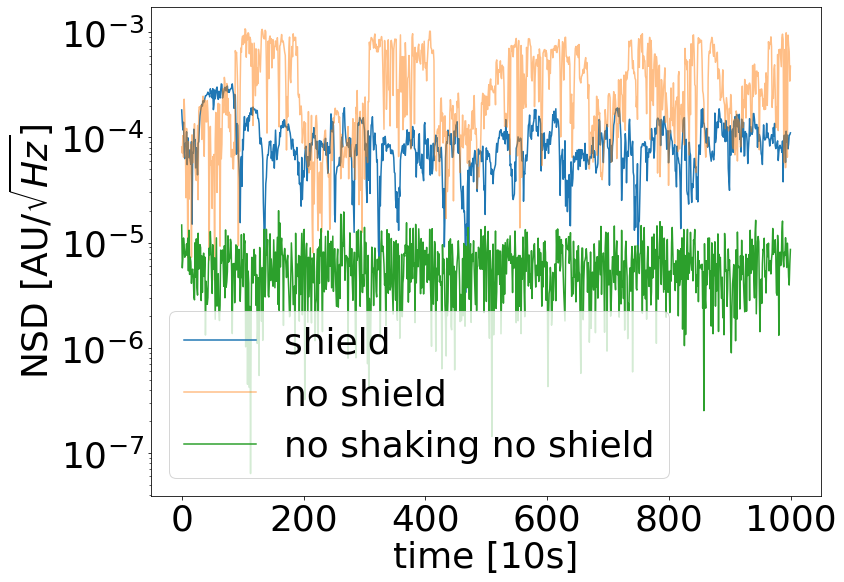

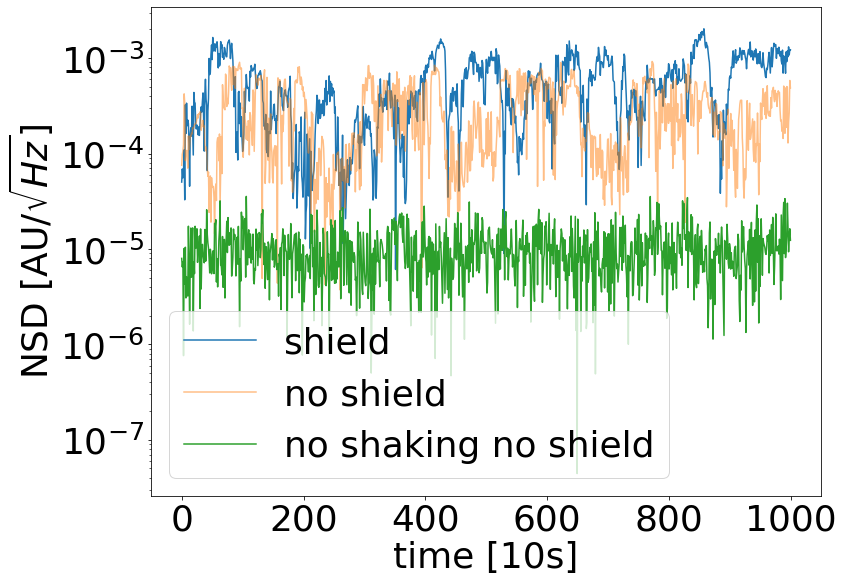

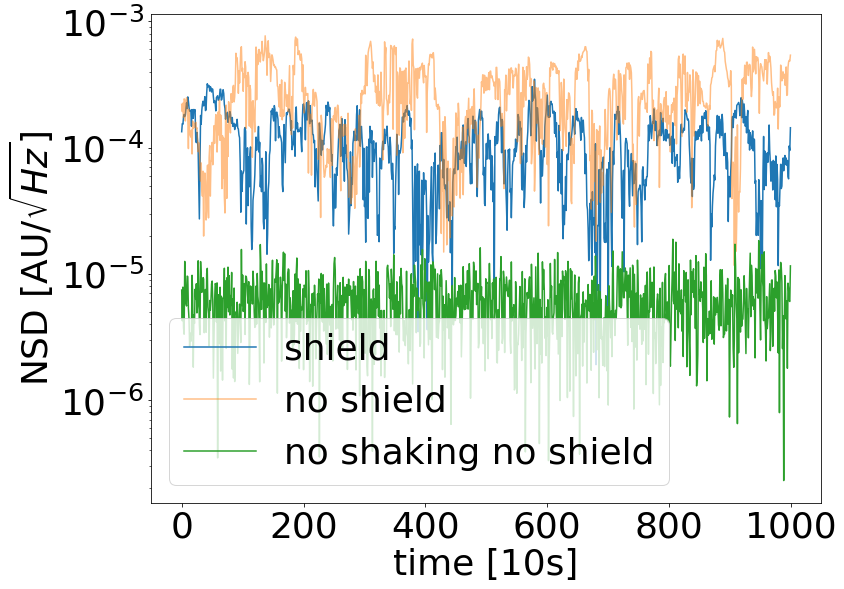

In [75]:
for i in np.arange(0,15,1):
    harmonic = i
    plt.plot(df_shaking24["%d" %harmonic], label = "shield")
    plt.plot(df_shaking25["%d" %harmonic], label = "no shield",alpha=0.5)
    plt.plot(df_shaking28["%d" %harmonic], label = "no shaking no shield")
    plt.legend()
    plt.ylabel(r"NSD [AU/$\sqrt{Hz}$]")
    plt.xlabel("time [10s]")
    plt.yscale("log")
    plt.savefig("%d_harmonic.png" %harmonic, dpi=300, bbox_inches ="tight")
    plt.show()

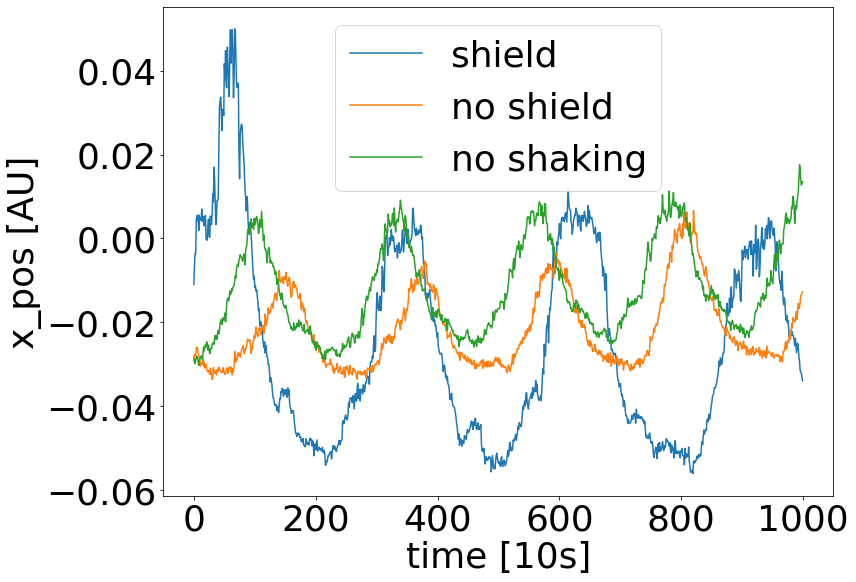

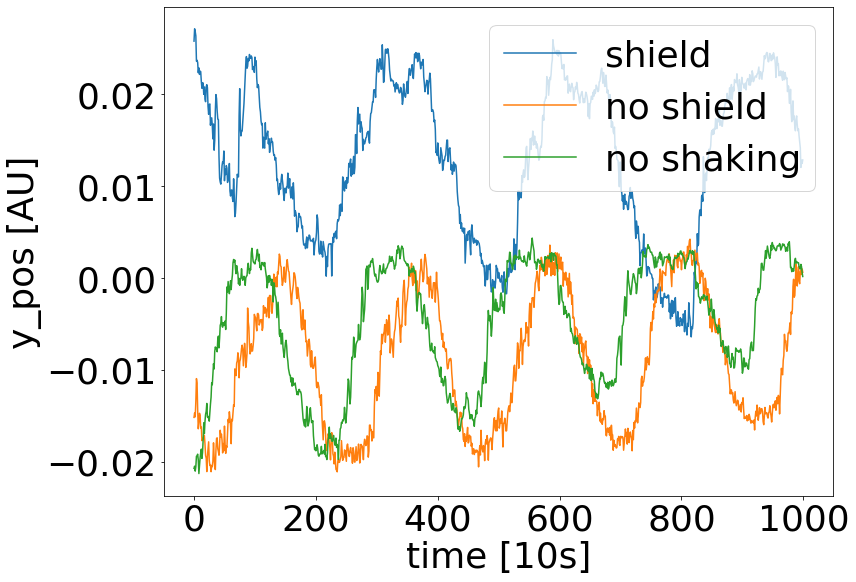

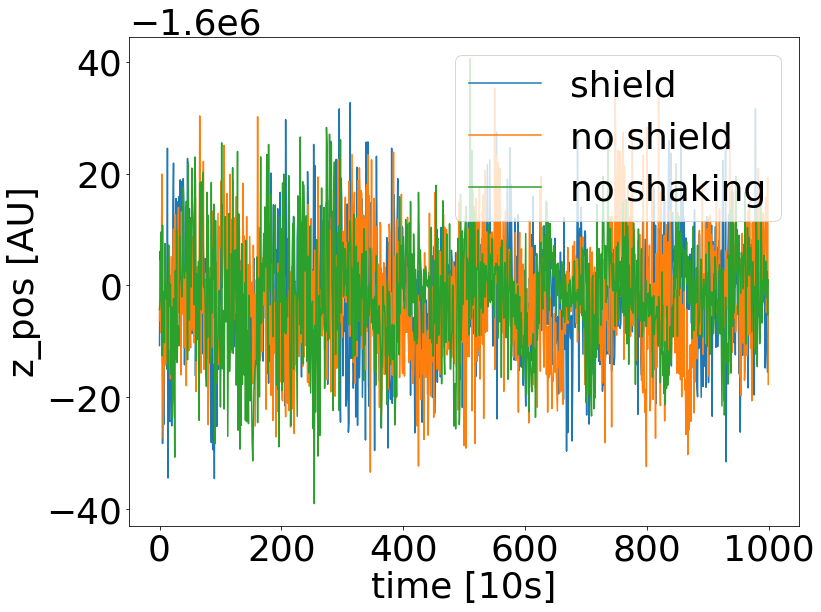

In [76]:
axis = ["x","y","z"]
for element in axis:
    plt.plot(df_shaking24["%s_mean" %element], label = "shield")
    plt.plot(df_shaking25["%s_mean" %element], label = "no shield")
    plt.plot(df_shaking28["%s_mean" %element], label = "no shaking")
    plt.legend()
    plt.ylabel(r"%s_pos [AU]" %element)
    plt.xlabel("time [10s]")
    #plt.yscale("log")
    plt.savefig("%s_mean.png" %element, dpi=300, bbox_inches ="tight")
    plt.show()

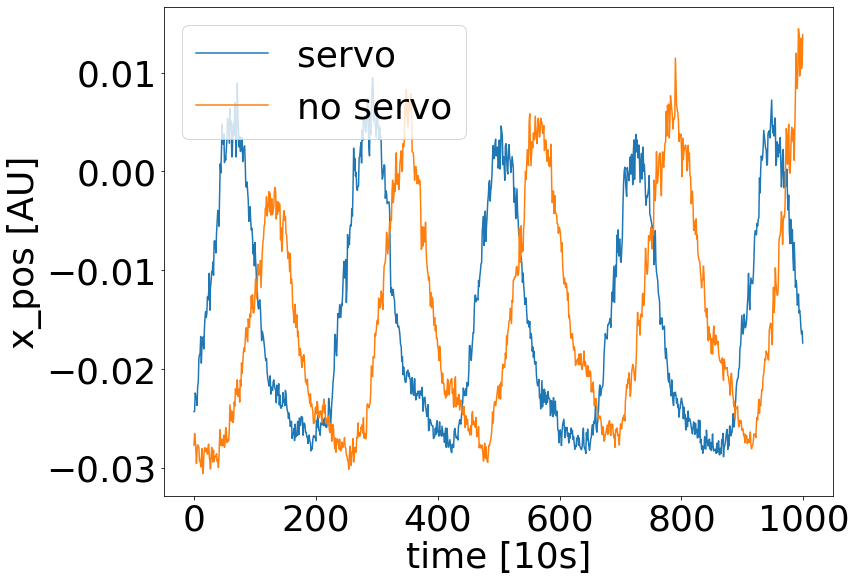

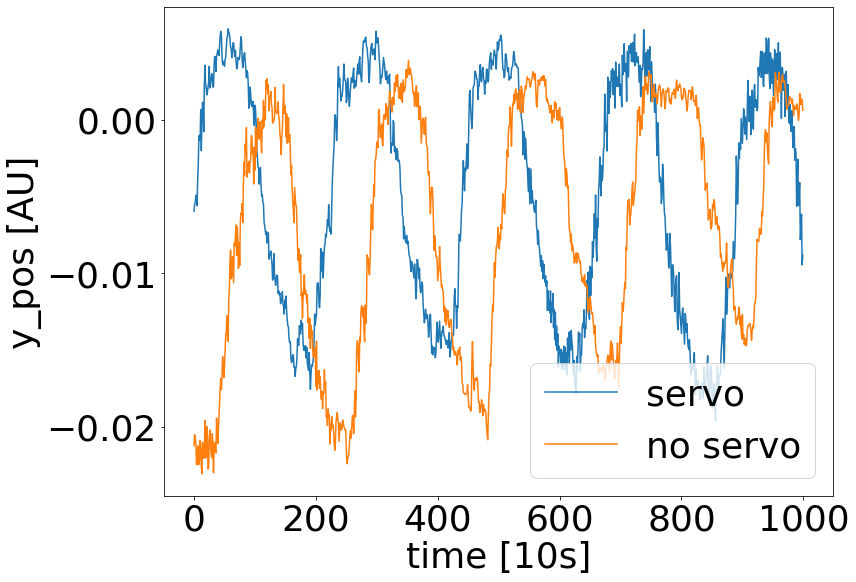

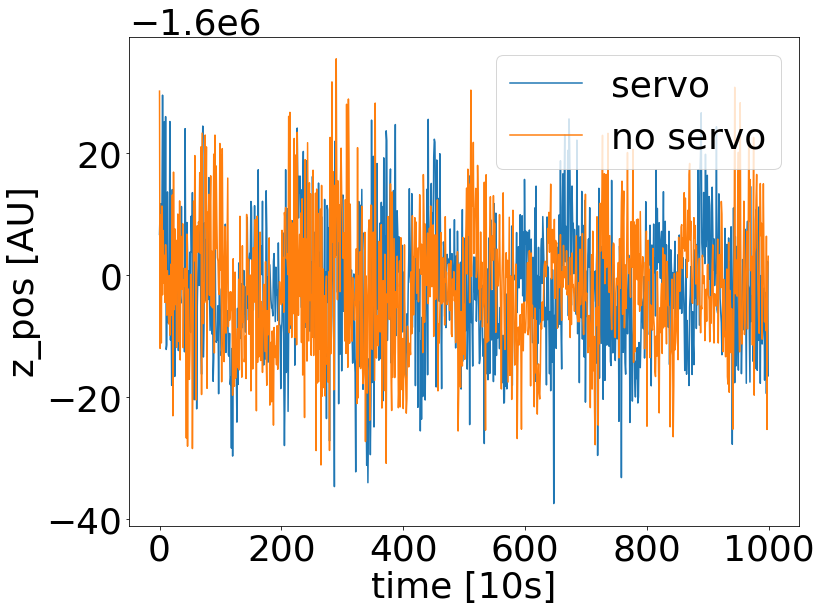

In [77]:
axis = ["x","y","z"]
for element in axis:
    plt.plot(df_shaking26["%s_mean" %element], label = "servo")
    plt.plot(df_shaking27["%s_mean" %element], label = "no servo")
    plt.legend()
    plt.ylabel(r"%s_pos [AU]" %element)
    plt.xlabel("time [10s]")
    #plt.yscale("log")
    plt.savefig("%s_mean_servo.png" %element, dpi=300, bbox_inches ="tight")
    plt.show()

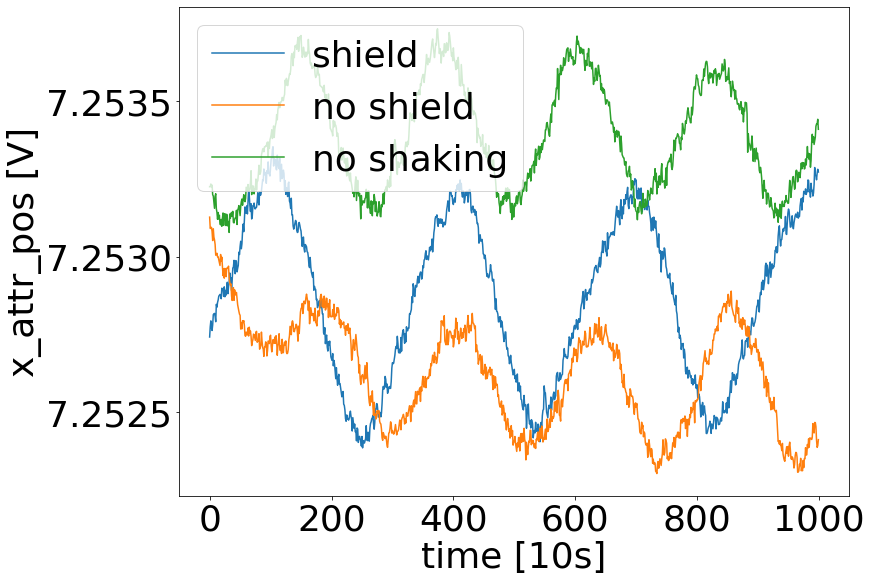

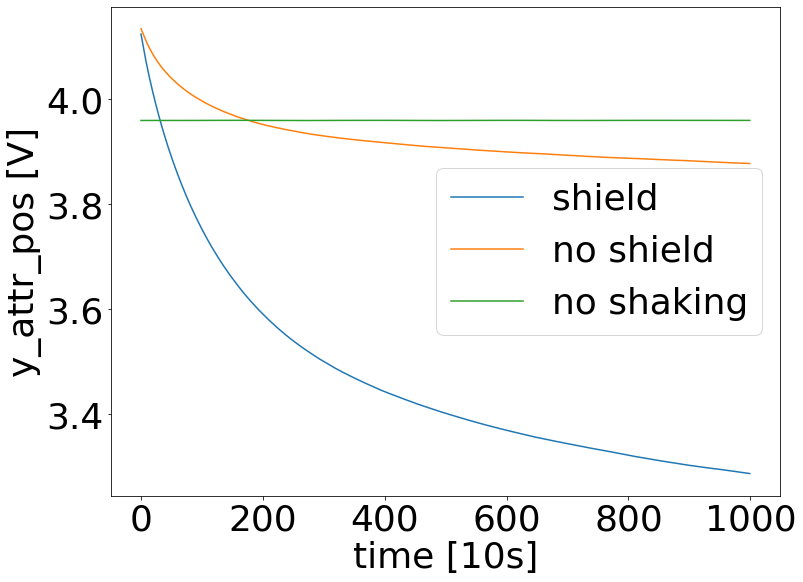

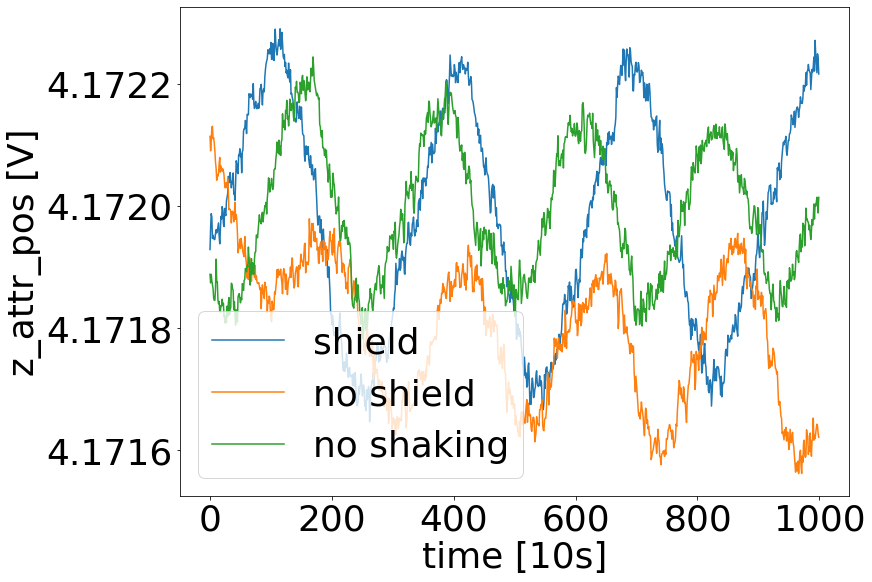

In [78]:
axis = ["x","y","z"]
for element in axis:
    plt.plot(df_shaking24["attractor_position_%s" %element], label = "shield")
    plt.plot(df_shaking25["attractor_position_%s" %element], label = "no shield")
    plt.plot(df_shaking28["attractor_position_%s" %element], label = "no shaking")
    plt.legend()
    plt.ylabel(r"%s_attr_pos [V]" %element)
    plt.xlabel("time [10s]")
    #plt.yscale("log")
    plt.savefig("attractor_position_%s.png" %element, dpi=300, bbox_inches ="tight")
    plt.show()

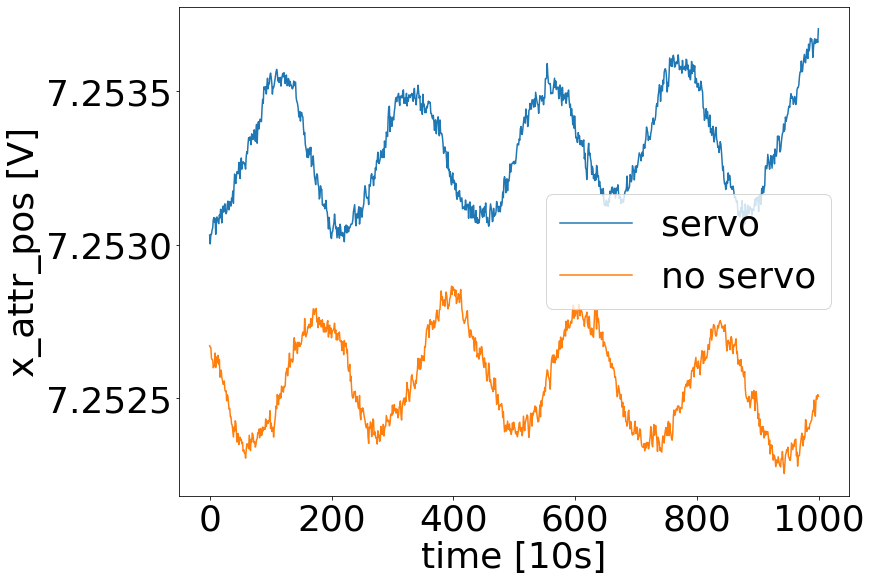

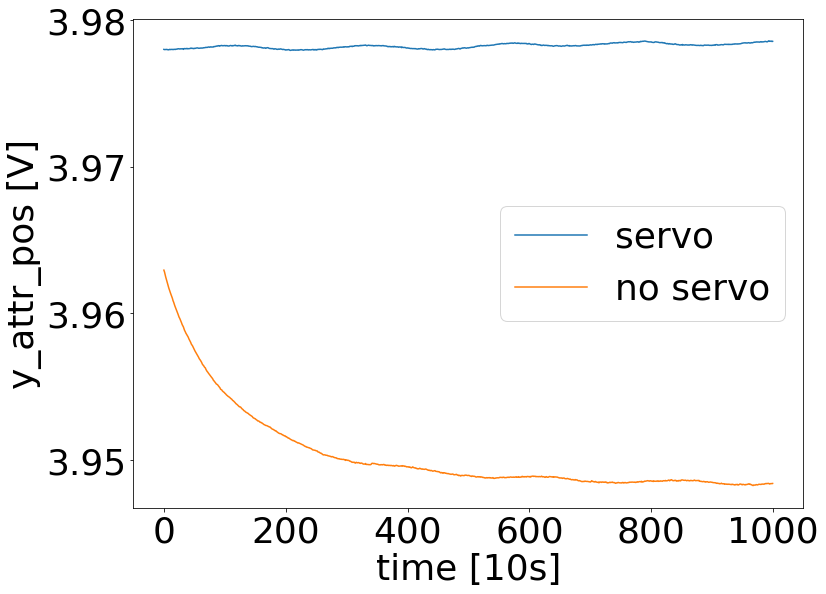

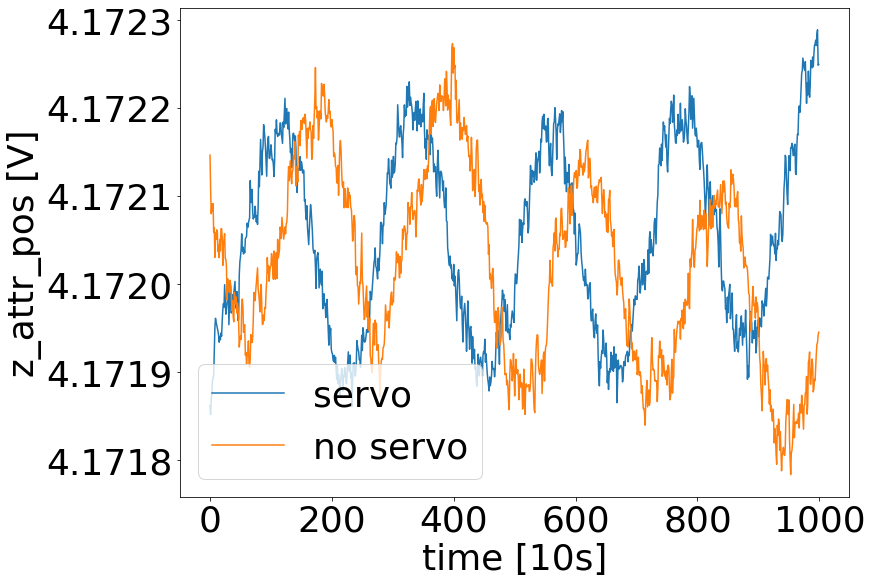

In [79]:
axis = ["x","y","z"]
for element in axis:
    plt.plot(df_shaking26["attractor_position_%s" %element], label = "servo")
    plt.plot(df_shaking27["attractor_position_%s" %element], label = "no servo")
    plt.legend()
    plt.ylabel(r"%s_attr_pos [V]" %element)
    plt.xlabel("time [10s]")
    #plt.yscale("log")
    plt.savefig("attractor_position_%s_servo.png" %element, dpi=300, bbox_inches ="tight")
    plt.show()

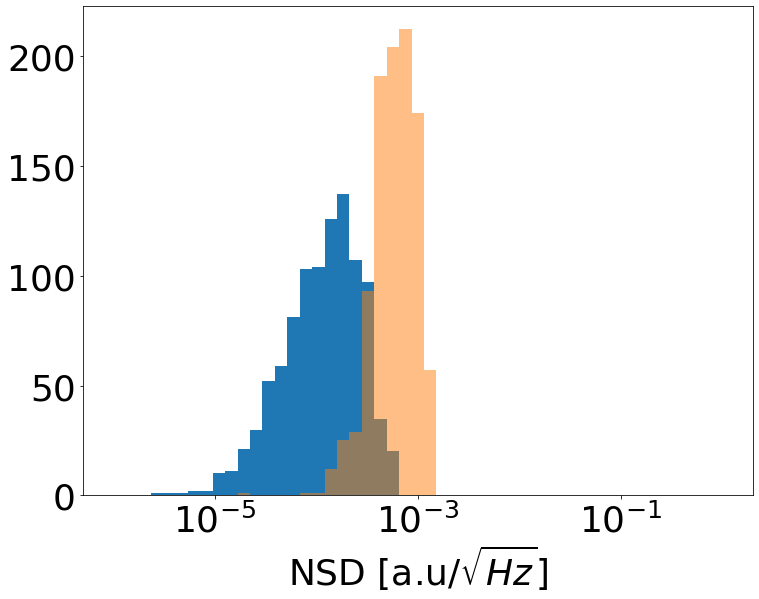

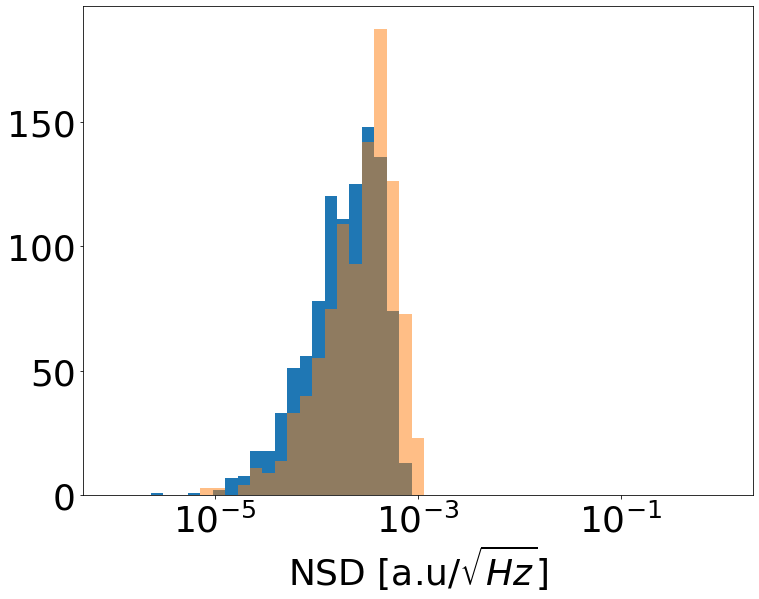

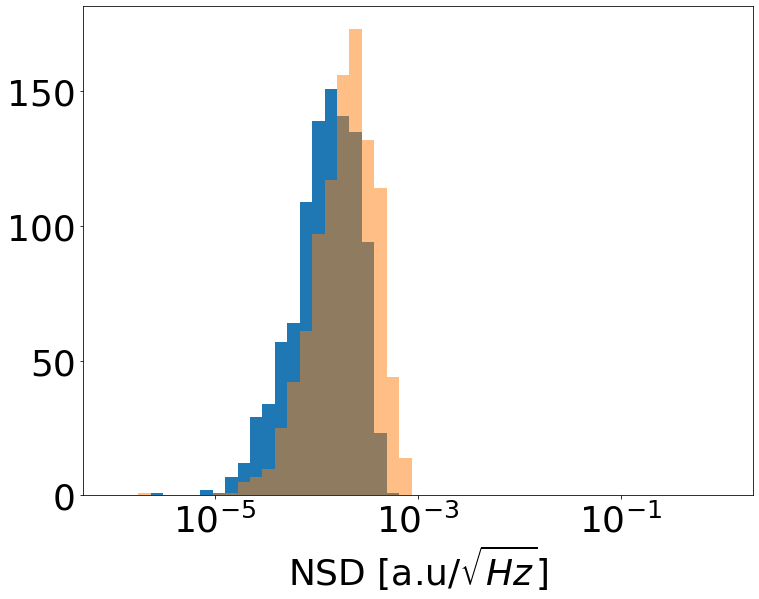

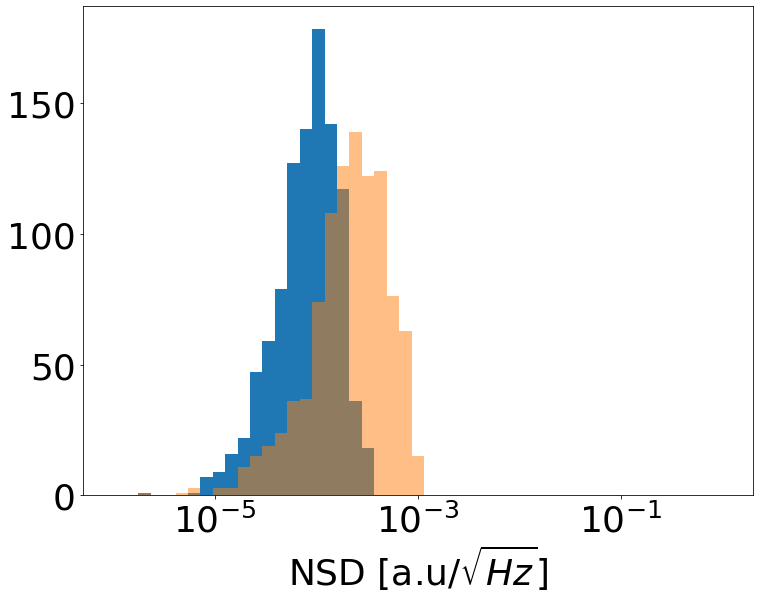

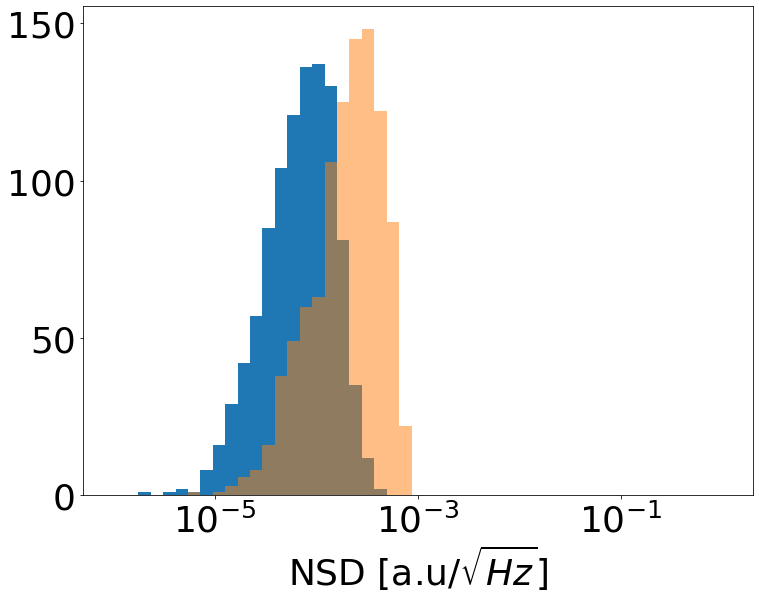

...

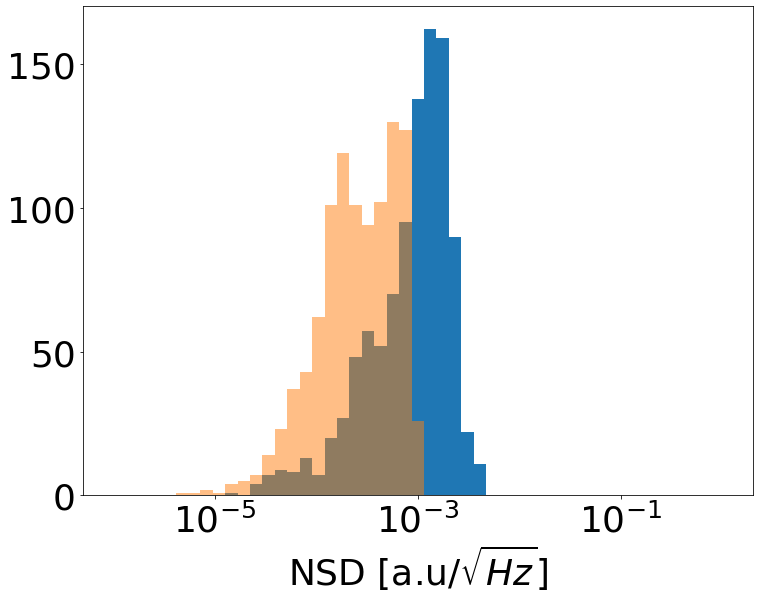

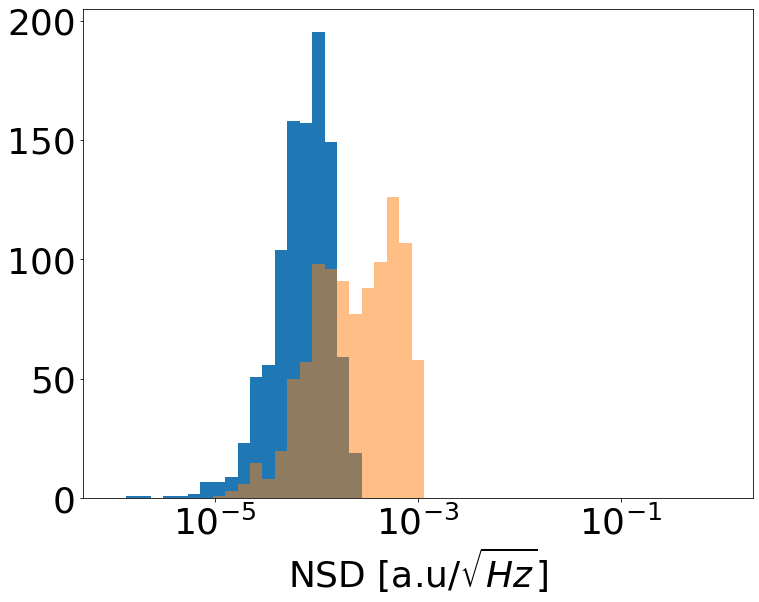

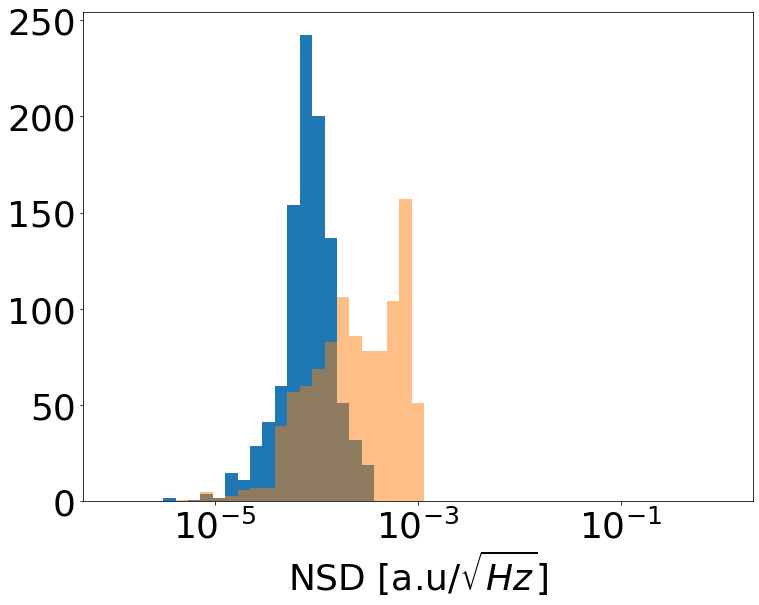

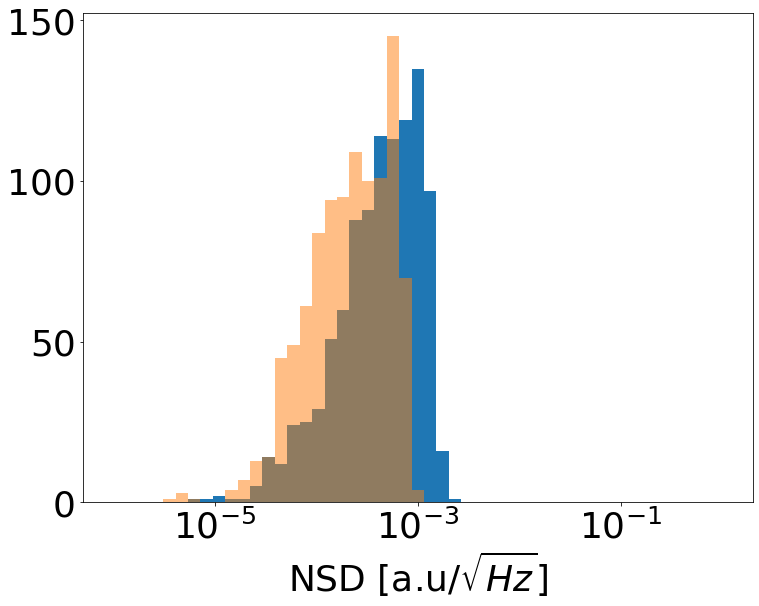

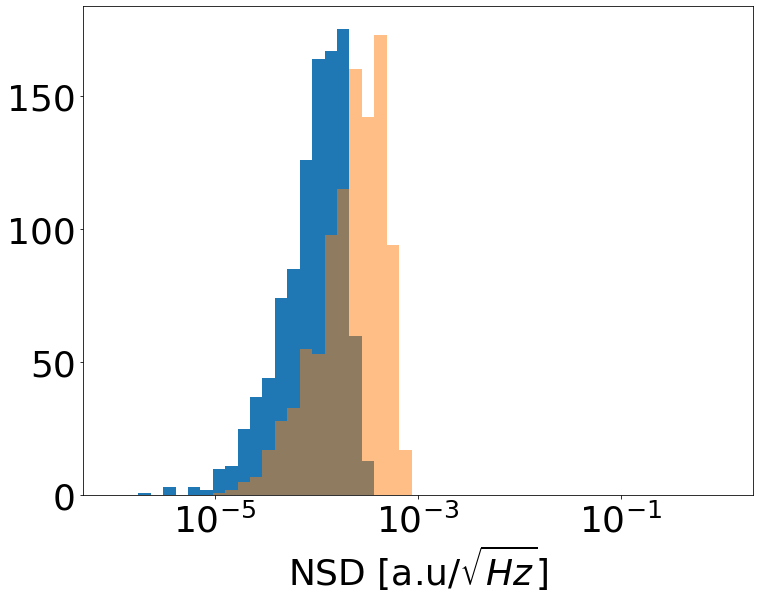

In [178]:
for i in np.arange(0,15,1):
    harmonic =i
#plt.hist(df_shaking24["%d" %harmonic], bins=bins,range=(0,1e-6))
#plt.hist(df_shaking25["%d" %harmonic], bins=bins, alpha=0.5,range=(0,1e-6))
#plt.hist(df_shaking26["%d" %harmonic], bins=bins, alpha=0.3,range=(0,1e-6))


    plt.hist(df_shaking24["%d" %harmonic], bins=np.logspace(np.log10(1e-6),np.log10(1), 50))
    plt.hist(df_shaking25["%d" %harmonic], bins=np.logspace(np.log10(1e-6),np.log10(1), 50),alpha=0.5)
    plt.xlabel(r"NSD [a.u/$\sqrt{Hz}$]")
    plt.xscale("log")
    plt.savefig("Results/histo_amp_%d" %harmonic, bbox_inches = "tight")
    plt.show()
    

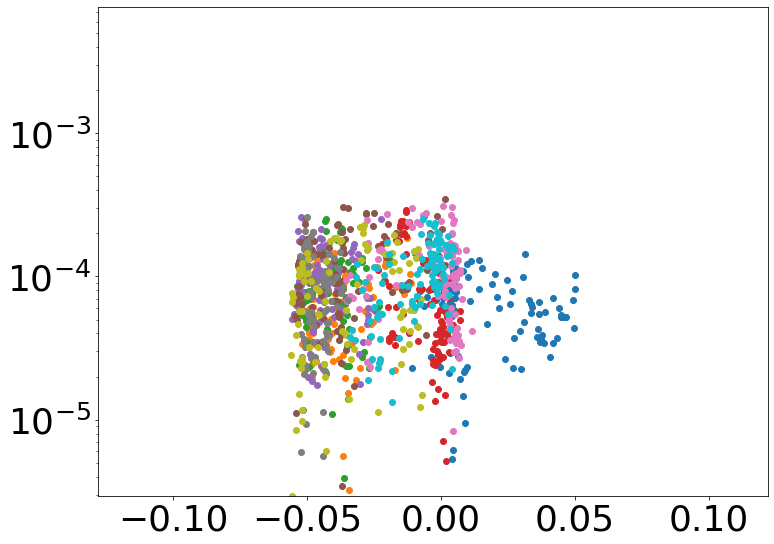

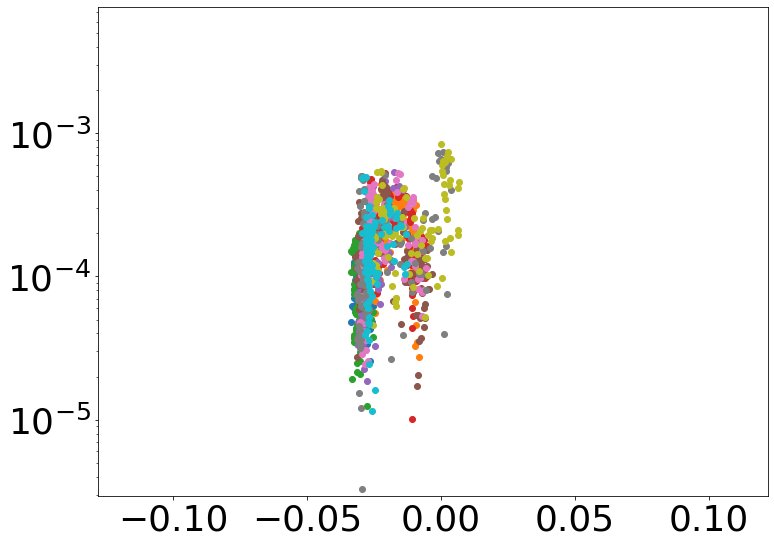

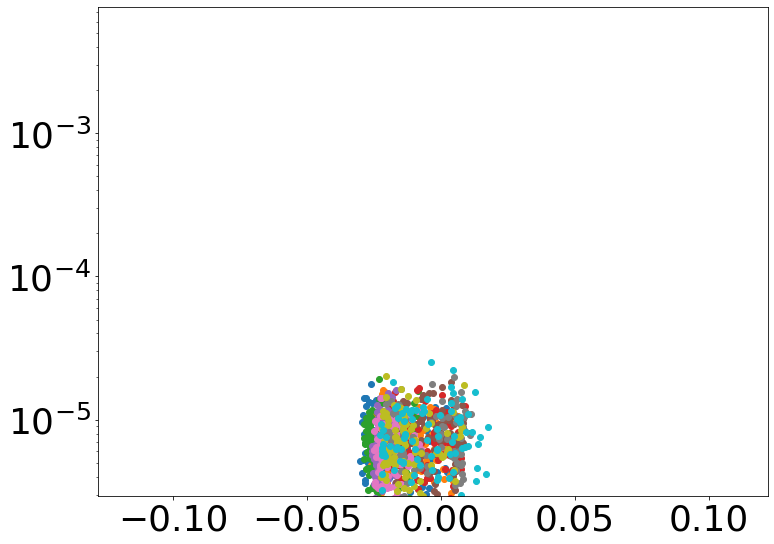

In [177]:
var_of_interest = "x_mean"
harmonic = 5
stepsize = 100
for i in np.arange(0,1000,stepsize):
    plt.scatter(df_shaking24["%s" %var_of_interest][i:i+stepsize],df_shaking24["%d" %harmonic][i:i+stepsize],label="shield")
    plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
    plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
    plt.yscale("log")
plt.show()        
for i in np.arange(0,1000,stepsize):
    plt.scatter(df_shaking25["%s" %var_of_interest][i:i+stepsize],df_shaking25["%d" %harmonic][i:i+stepsize],label="shield")
    plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
    plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
    plt.yscale("log")
plt.show()        
for i in np.arange(0,1000,stepsize):
    plt.scatter(df_shaking28["%s" %var_of_interest][i:i+stepsize],df_shaking28["%d" %harmonic][i:i+stepsize],label="shield")
    plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
    plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
    plt.yscale("log")
plt.show()    

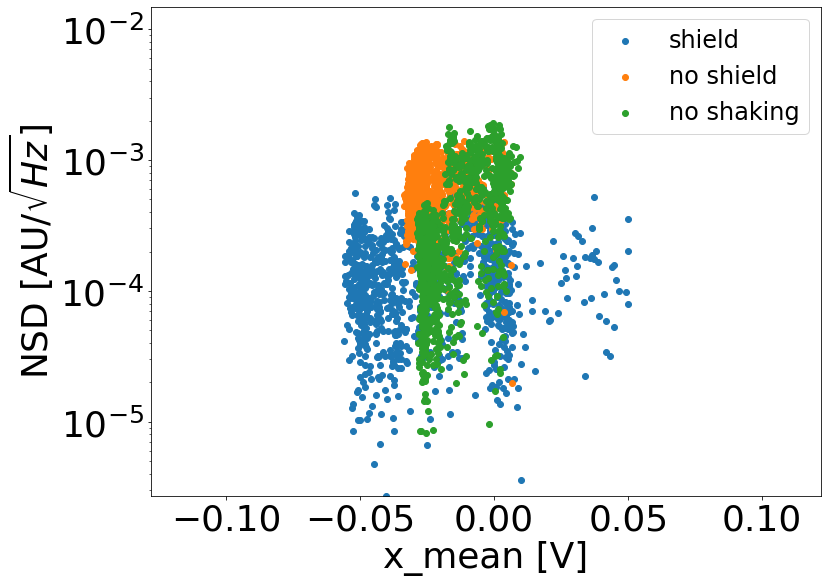

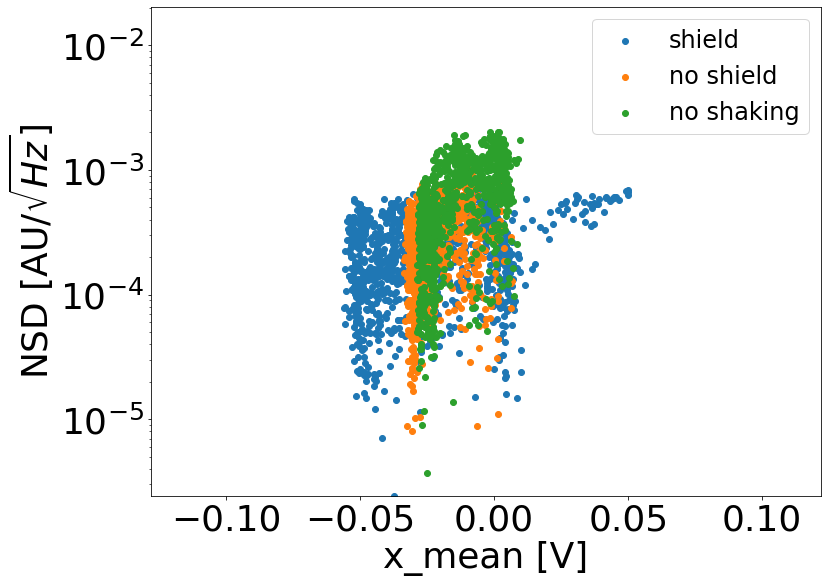

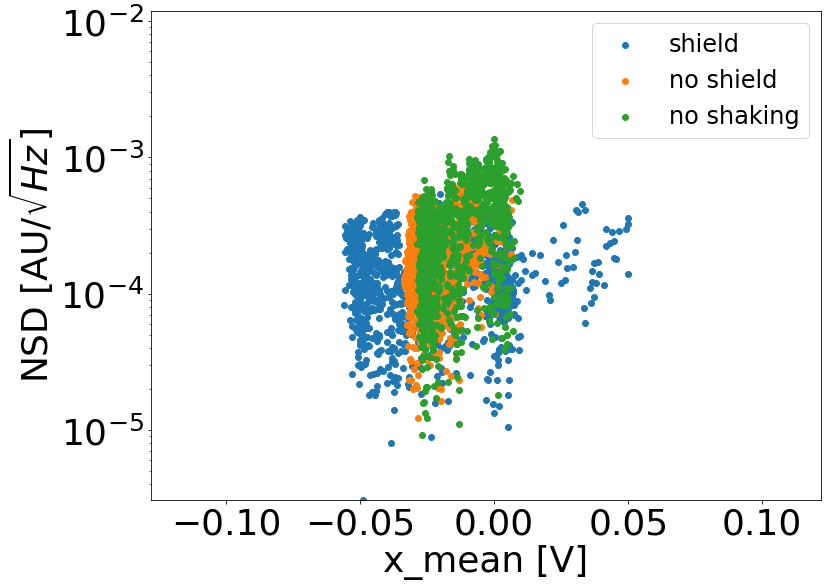

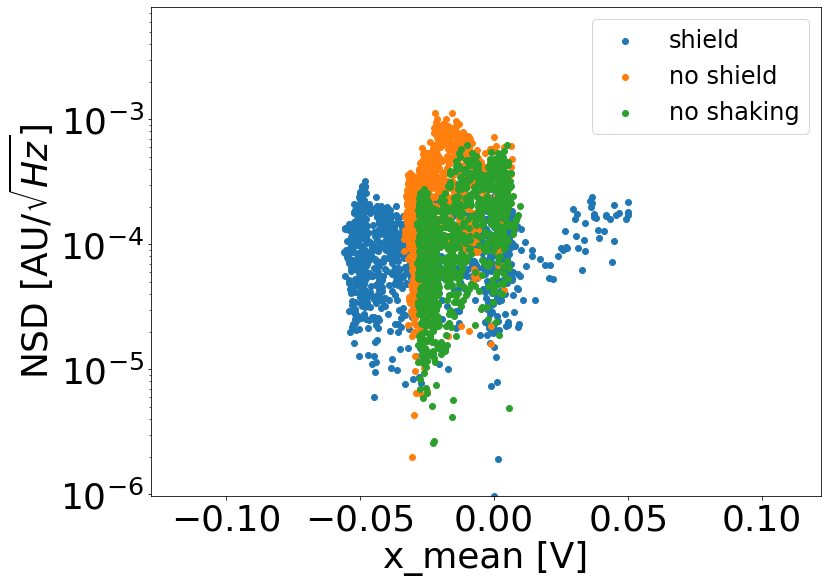

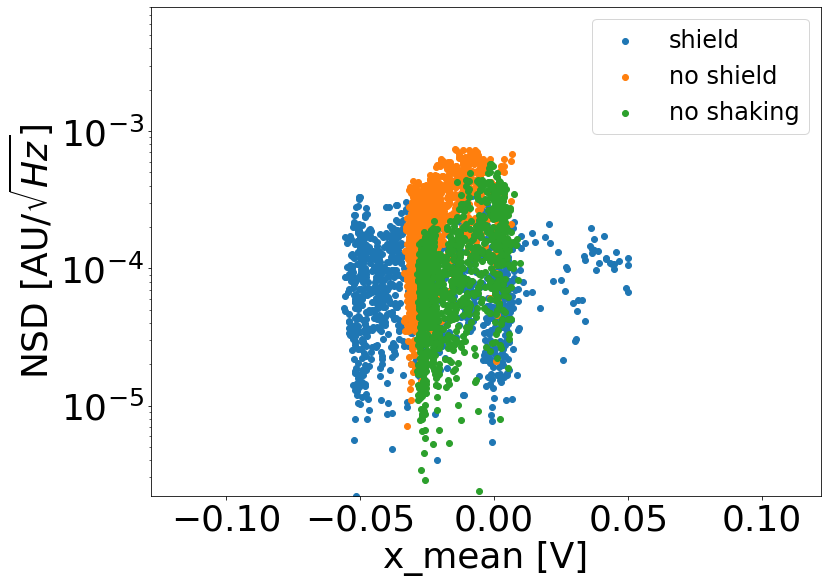

...

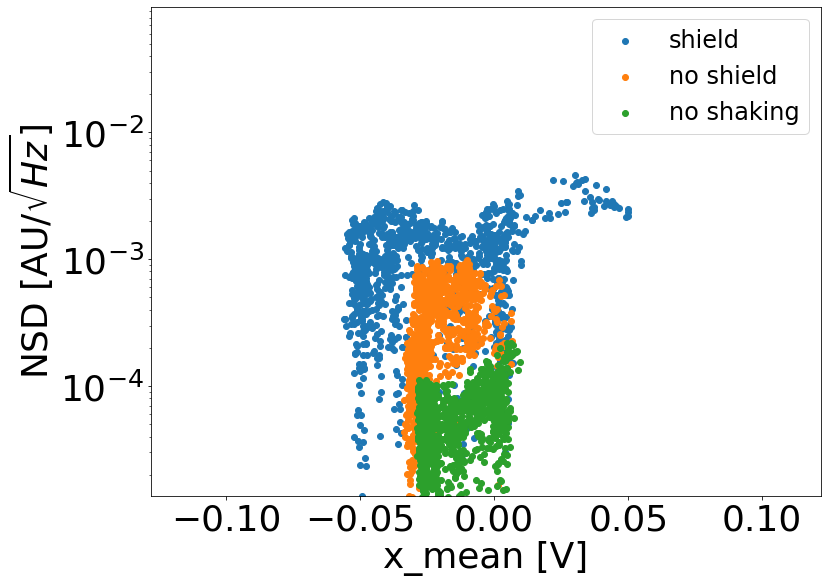

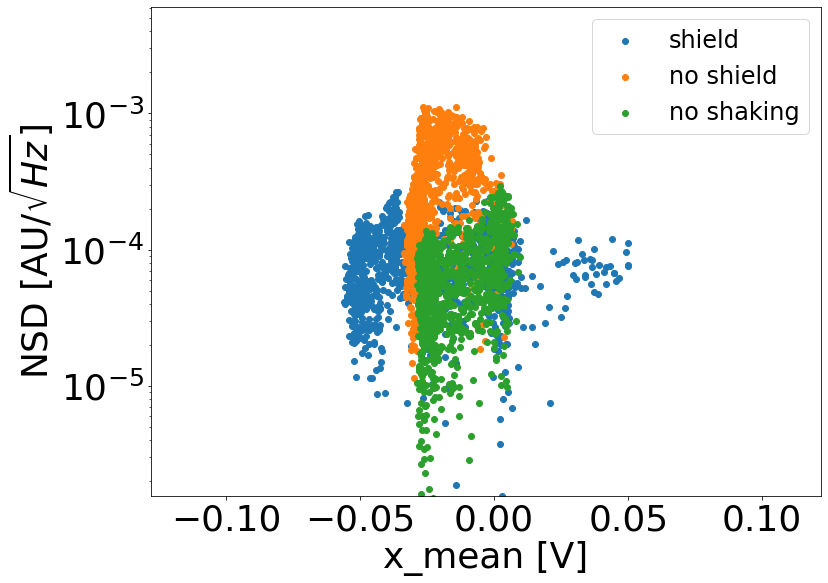

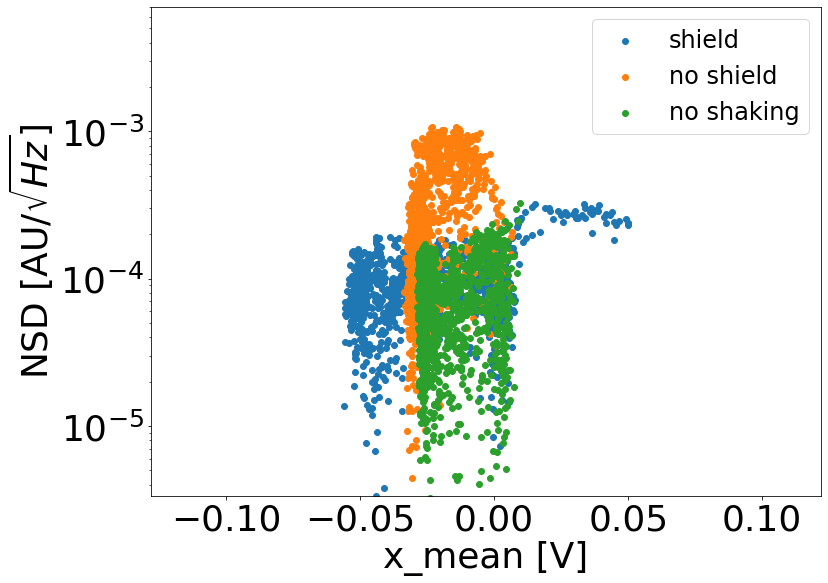

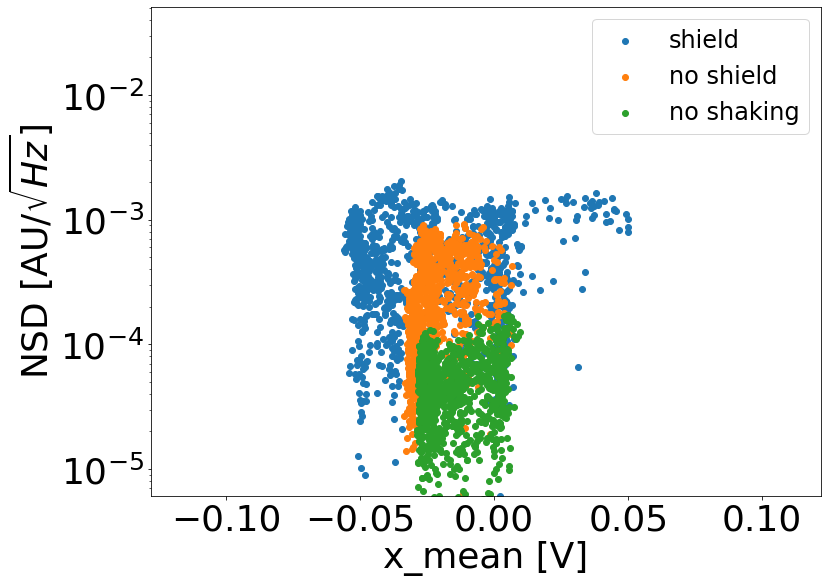

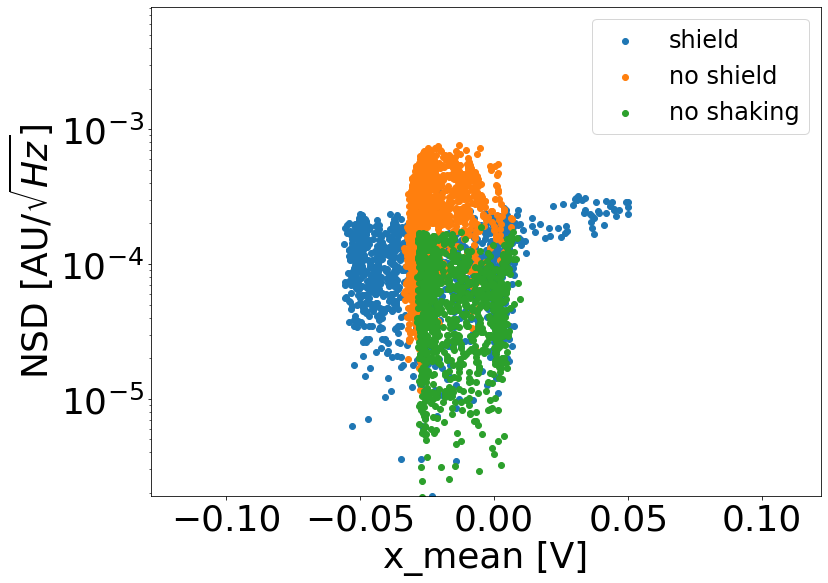

In [82]:
for i in np.arange(0,15,1):
    harmonic = i
    var_of_interest = "x_mean"
    plt.scatter(df_shaking24["%s" %var_of_interest],df_shaking24["%d" %harmonic],label="shield")
    plt.scatter(df_shaking25["%s" %var_of_interest],df_shaking25["%d" %harmonic],label="no shield")
    plt.scatter(df_shaking26["%s" %var_of_interest],df_shaking26["%d" %harmonic], label = "no shaking")
    plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
    plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
    plt.yscale("log")
    plt.ylabel(r"NSD [AU/$\sqrt{Hz}$]")
    plt.xlabel("%s [V]" %var_of_interest )
    plt.legend(fontsize=24)
    plt.savefig("Results/Correlation_Analysis/harmonic%d_vs_%s" %(i,var_of_interest), bbox_inches ="tight")
    plt.show()

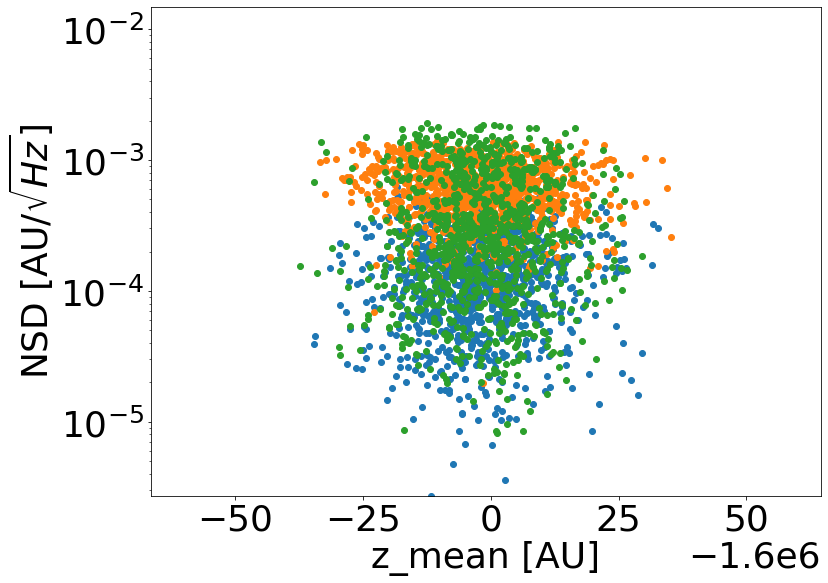

In [83]:
harmonic = 0
var_of_interest = "z_mean"
plt.scatter(df_shaking24["%s" %var_of_interest],df_shaking24["%d" %harmonic])
plt.scatter(df_shaking25["%s" %var_of_interest],df_shaking25["%d" %harmonic])
plt.scatter(df_shaking26["%s" %var_of_interest],df_shaking26["%d" %harmonic])
plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
plt.yscale("log")
plt.ylabel(r"NSD [AU/$\sqrt{Hz}$]")
plt.xlabel("%s [AU]" %var_of_interest )
plt.show()

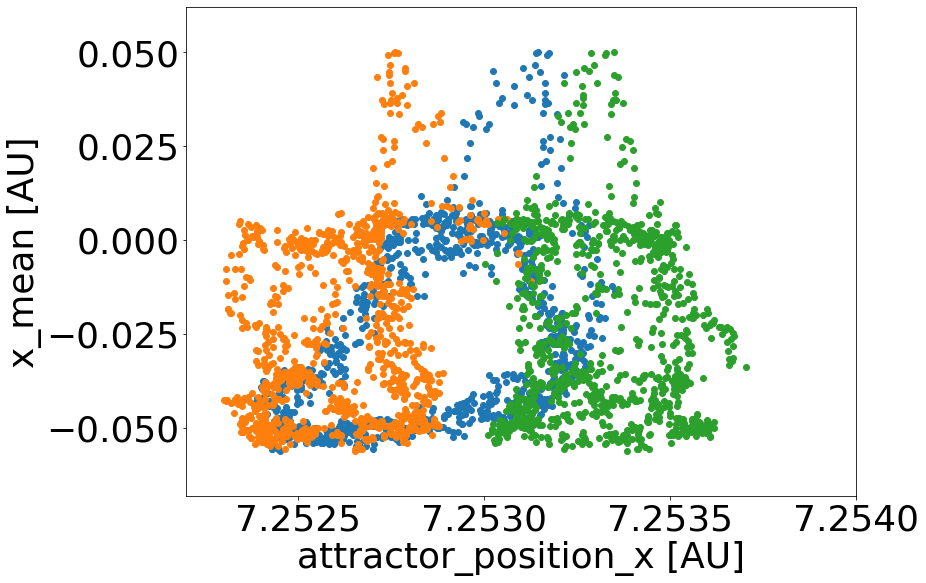

In [84]:
harmonic = 6
var_of_interest2 = "x_mean"
var_of_interest = "attractor_position_x" 
plt.scatter(df_shaking24["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
plt.scatter(df_shaking25["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
plt.scatter(df_shaking26["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
#plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
#plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
#plt.yscale("log")
plt.ylabel("%s [AU]" %var_of_interest2 )
plt.xlabel("%s [AU]" %var_of_interest )
plt.xlim(7.2522,7.2540)
plt.show()

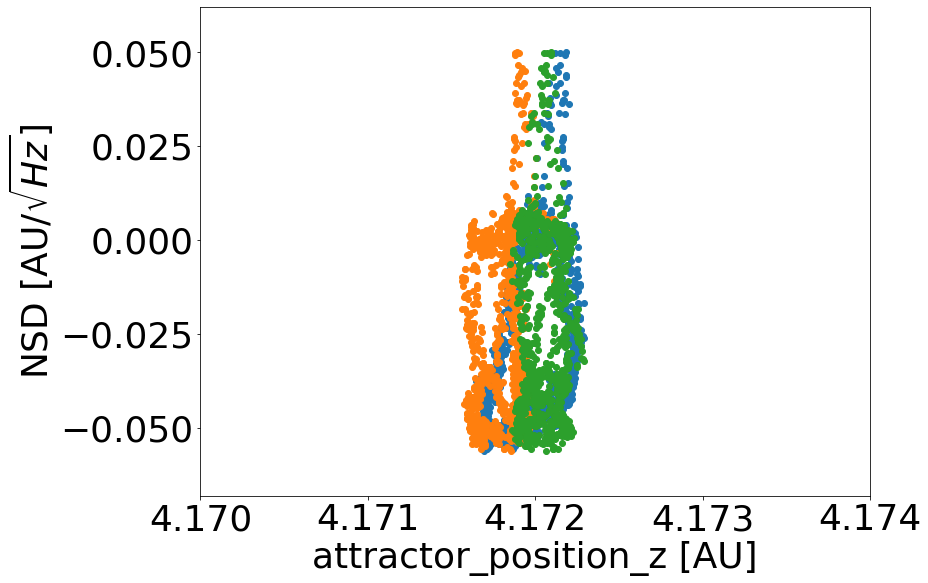

In [85]:
harmonic = 0
var_of_interest2 = "x_mean"
var_of_interest = "attractor_position_z" 
plt.scatter(df_shaking24["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
plt.scatter(df_shaking25["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
plt.scatter(df_shaking26["%s" %var_of_interest],df_shaking24["%s" %var_of_interest2])
#plt.xlim(np.min(df_shaking24["%s" %var_of_interest])-3*np.std(df_shaking24["%s" %var_of_interest]),np.max(df_shaking24["%s" %var_of_interest])+3*np.std(df_shaking24["%s" %var_of_interest]))
#plt.ylim(np.min(df_shaking24["%d" %harmonic]),np.max(df_shaking24["%d" %harmonic])+120*np.std(df_shaking24["%d" %harmonic]))
#plt.yscale("log")
plt.ylabel(r"NSD [AU/$\sqrt{Hz}$]")
plt.xlabel("%s [AU]" %var_of_interest )
plt.xlim(4.170,4.174)
plt.show()

In [86]:
air,surface,pressure = get_temperature_and_pressure(20191115,16,19)


ValueError: x and y must have same first dimension, but have shapes (600,) and (1000,)

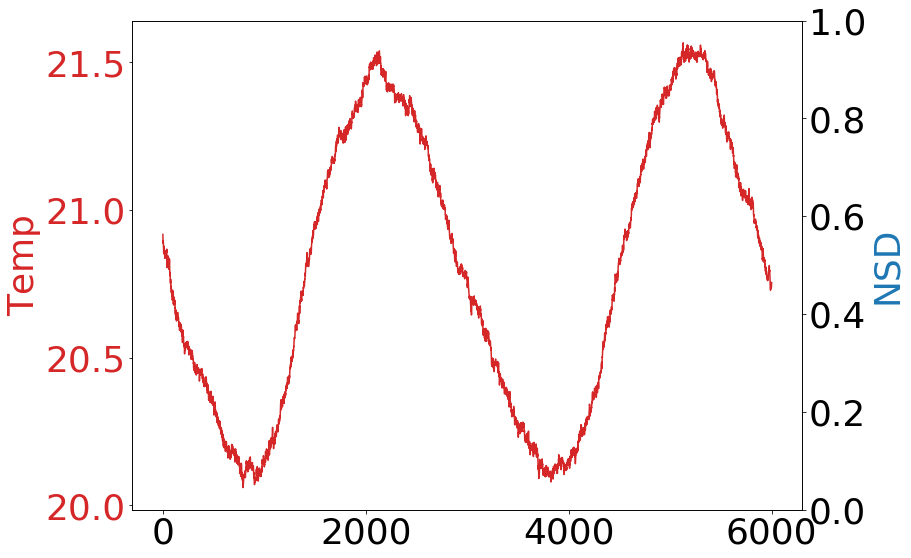

In [87]:


# Create some mock data
env_var = np.arange(0,6000,1)
shaking_var = np.arange(0,6000,10)
data1 = air[600:np.max(env_var)+601]
data1b = pressure[600:np.max(env_var)+601]
data2 = df_shaking24["x_mean"]
data3 = df_shaking24["y_mean"]
fig, ax1 = plt.subplots()

color = 'tab:red'
#ax1.set_xlabel('time (s)')
ax1.set_ylabel('Temp', color=color)
ax1.plot(env_var, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)
#ax1.axvline(2100)
#ax1.axvline(5200)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('NSD', color=color)  # we already handled the x-label with ax1
ax2.plot(shaking_var, data2, color=color, label = "x")
ax2.plot(shaking_var, data3, color="g", label = "y")

ax2.tick_params(axis='y', labelcolor=color)
plt.legend()
fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.savefig("temperature_vs_x_and_y.png", dpi=300, bbox_inches = "tight")
plt.show()

In [ ]:
# Create some mock data
env_var = np.arange(0,10000,1)
shaking_var = np.arange(0,10000,10)
data1 = air[600:np.max(env_var)+601]
data2 = df_shaking25["y_mean"]
fig, ax1 = plt.subplots()

color = 'tab:red'
#ax1.set_xlabel('time (s)')
ax1.set_ylabel('Temp', color=color)
ax1.plot(env_var, data1, color=color)
ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:blue'
ax2.set_ylabel('NSD', color=color)  # we already handled the x-label with ax1
ax2.plot(shaking_var, data2, color=color)
ax2.tick_params(axis='y', labelcolor=color)

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()